In [1]:
import xarray as xr
import pandas as pd
import numpy as np
import calendar as cld
import matplotlib.pyplot as plt
import matplotlib.colors
colors_land = plt.cm.terrain(np.linspace(0.25, 1, 256))
import proplot as pplt # New plot library (https://proplot.readthedocs.io/en/latest/)
pplt.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy.stats import chi2
from numba import njit,prange
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 0.05  # previous pdf hatch linewidth
from matplotlib.dates import DateFormatter

from scipy.stats import linregress

In [2]:
normal_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True,
                 'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[43.,48.5],'lonlim':[4.,16.]}
multiplot_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':False,
                    'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[43.,48.5],'lonlim':[4.,16.]}

imin = 32 ; imax = -30
jmin = 20 ; jmax = -15
ds = xr.open_dataset('/bettik/beaumetj/MARout/MAR-ERA-20C/MARgrid_EUf.nc')
lon = ds.LON[jmin:jmax,imin:imax]
lat = ds.LAT[jmin:jmax,imin:imax]
H = np.array(ds.SH[jmin:jmax,imin:imax])

In [3]:
def detect_alps(H):
    nlat,nlon = np.shape(H)
    mask = np.bool_(np.zeros((nlat,nlon)))
    r = 4
    for j in range(r,nlat-r):
        for i in range(r,nlon-r):
            mask[j,i] = np.logical_and(H[j,i]>360 ,np.any(H[j-r:j+r,i-r:i+r]>1300))
            # mask[j,i] = np.std(H[j-r:j+r,i-r:i+r])>200
    return mask
alps = detect_alps(H)
alps[lon<4.8] = False
alps[np.logical_and(lon>10,lat<45.2)] = False


In [4]:
ne_alps = np.copy(alps) # ne : north-east
ne_alps[lat<46.7] = False


nw_alps2 = np.copy(alps) # nw : north-west
nw_alps2[lon>7.9] = False
nw_alps2[lat<45.9] = False
nw_alps2[lat>46.7] = False

nw_alps3 = np.copy(alps) # nw : north-west
nw_alps3[lon>6.9] = False
nw_alps3[lat<44.8] = False
nw_alps3[lat>46.7] = False

nw_alps4 = np.copy(alps) # nw : north-west
nw_alps4[lon>8.3] = False
nw_alps4[lat<46.4] = False
nw_alps4[lat>46.7] = False

nw_alps5 = np.copy(alps) # nw : north-west
nw_alps5[lon>7.1] = False
nw_alps5[lat<45.2] = False
nw_alps5[lat>46.7] = False

nw_alps = np.logical_or(np.logical_or(np.logical_or(nw_alps2,nw_alps3),nw_alps4),nw_alps5)


s_alps = np.logical_and(alps,np.invert(np.logical_or(nw_alps,ne_alps)))

In [5]:
# Levels (altitude bands)

levels = [np.logical_and(alps,H<400), np.logical_and(alps,np.logical_and(H>=400,H<600)), np.logical_and(alps,np.logical_and(H>=600,H<800)),
          np.logical_and(alps,np.logical_and(H>=800,H<1000)), np.logical_and(alps,np.logical_and(H>=1000,H<1200)), np.logical_and(alps,np.logical_and(H>=1200,H<1400)),
          np.logical_and(alps,np.logical_and(H>=1400,H<1600)), np.logical_and(alps,np.logical_and(H>=1600,H<1800)), np.logical_and(alps,np.logical_and(H>=1800,H<2000)),
          np.logical_and(alps,np.logical_and(H>=2000,H<2200)), np.logical_and(alps,np.logical_and(H>=2200,H<2400)), np.logical_and(alps,np.logical_and(H>=2400,H<2600)),
          np.logical_and(alps,np.logical_and(H>=2600,H<2800)), np.logical_and(alps,np.logical_and(H>=2800,H<3000)),
          np.logical_and(alps,H>=3000)]#,
          #alps]

H_levels = [300,500,700,900,1100,1300,1500,1700,1900,2100,2300,2500,2700,2900,3100]
H_levels_pressure = [760,1460,1950,3015,4210,5580,11785]

### EC-Earth

In [6]:
wp_meanseason_meanT = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanT.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanT_hist = wp_meanseason_meanT[:54,:,:,:]
wp_meanseason_meanT_fut = wp_meanseason_meanT[55:,:,:,:]

wp_meanseason_meanT_50m = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanT_50m.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanT_50m_hist = wp_meanseason_meanT_50m[:54,:,:,:]
wp_meanseason_meanT_50m_fut = wp_meanseason_meanT_50m[55:,:,:,:]

wp_meanseason_meanT_100m = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanT_100m.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanT_100m_hist = wp_meanseason_meanT_100m[:54,:,:,:]
wp_meanseason_meanT_100m_fut = wp_meanseason_meanT_100m[55:,:,:,:]

In [7]:
hist = [wp_meanseason_meanT_hist,wp_meanseason_meanT_50m_hist,wp_meanseason_meanT_100m_hist]
fut = [wp_meanseason_meanT_fut,wp_meanseason_meanT_50m_fut,wp_meanseason_meanT_100m_fut]

# 3 heights, 4 seasons, 91x139 pixels
origin_T_hist=np.full((3,4,91,139),np.nan)
slope_T_hist=np.full((3,4,91,139),np.nan)
pvalue_T_hist=np.full((3,4,91,139),np.nan)

origin_T_fut=np.full((3,4,91,139),np.nan)
slope_T_fut=np.full((3,4,91,139),np.nan)
pvalue_T_fut=np.full((3,4,91,139),np.nan)

for i in range(wp_meanseason_meanT.shape[3]):
    # print(str(lon)+'/'+str(les_season_maxT.shape[3]),end=' ')
    for j in range(wp_meanseason_meanT.shape[2]):
        for season in range(4):
            for h in range(0,3):
                # h for height : 2m, 50m or 100m
                linregress_T_hist = linregress(np.arange(hist[h].shape[0]), hist[h][:,season,j,i])
                origin_T_hist[h][season][j][i] = linregress_T_hist.intercept
                slope_T_hist[h][season][j][i] = linregress_T_hist.slope
                pvalue_T_hist[h][season][j][i] = linregress_T_hist.pvalue
                
                linregress_T_fut = linregress(np.arange(fut[h].shape[0]), fut[h][:,season,j,i])
                origin_T_fut[h][season][j][i] = linregress_T_fut.intercept
                slope_T_fut[h][season][j][i] = linregress_T_fut.slope
                pvalue_T_fut[h][season][j][i] = linregress_T_fut.pvalue

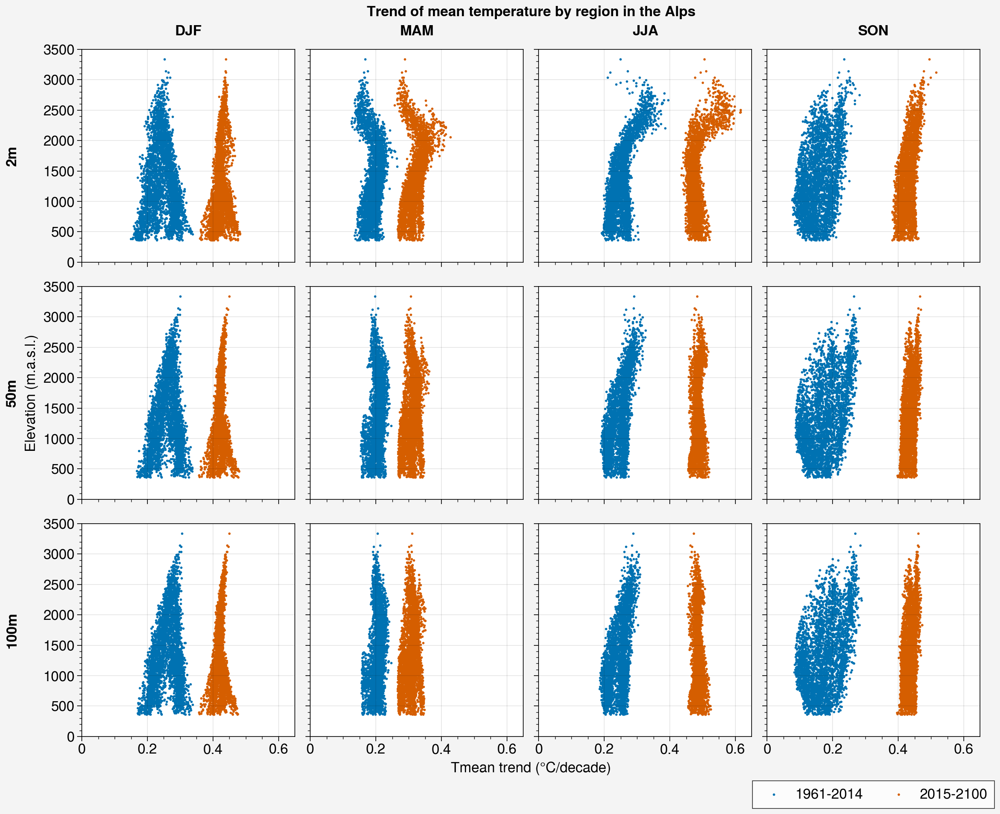

In [100]:
f, axs = pplt.subplots(ncols=4, nrows=3)
leg = ['1961-2014','2015-2100']

for i in range(4):
    slope_T_hist_alps_2m = np.ma.masked_array(slope_T_hist[0,i], mask=np.invert(alps))
    slope_T_hist_alps_50m = np.ma.masked_array(slope_T_hist[1,i], mask=np.invert(alps))
    slope_T_hist_alps_100m = np.ma.masked_array(slope_T_hist[2,i], mask=np.invert(alps))
    
    slopes=[slope_T_hist_alps_2m,slope_T_hist_alps_50m,slope_T_hist_alps_100m]
    
    for j,slope in enumerate(slopes):
        ax = axs[i+4*j]
        blue_dot = ax.scatter(10*slope.flatten(),H.flatten(),s=2)
        
    
for i in range(4):
    slope_T_fut_alps_2m = np.ma.masked_array(slope_T_fut[0,i], mask=np.invert(alps))
    slope_T_fut_alps_50m = np.ma.masked_array(slope_T_fut[1,i], mask=np.invert(alps))
    slope_T_fut_alps_100m = np.ma.masked_array(slope_T_fut[2,i], mask=np.invert(alps))
    
    slopes=[slope_T_fut_alps_2m,slope_T_fut_alps_50m,slope_T_fut_alps_100m]
    
    for j,slope in enumerate(slopes):
        ax = axs[i+4*j]
        orange_dot = ax.scatter(10*slope.flatten(),H.flatten(),s=2)
        ax.set_xlim((0.,0.65))
        ax.set_ylim((0.,3500))
#        if(j==3):
#            ax.legend([blue_dot,orange_dot],leg,loc='bottom')
ax.legend([blue_dot,orange_dot],leg,loc='bottom')
axs.format(suptitle='Trend of mean temperature by region in the Alps',collabels=['DJF','MAM','JJA', 'SON'],
           rowlabels=['2m','50m','100m'],xlabel='Tmean trend (°C/decade)',ylabel='Elevation (m.a.s.l.)')

In [8]:
# Ajout de coordonnée verticale pression dans le cas de l'atmosphère standard OACI
def z_to_p(H):
    p0 = 1013.25 # hPa
    gamma = 6.5*10**(-3) # K/m
    T0 = 288.5 # K
    g = 9.81 # m.s^-2
    R = 287 # J/kg/K
    pressure = p0*(1-gamma/T0*H)**(g/gamma/R)
    return pressure


def p_to_z(P):
    p0 = 1013.25 # hPa
    gamma = 6.5*10**(-3) # K/m
    T0 = 288.5 # K
    g = 9.81 # m.s^-2
    R = 287 # J/kg/K
    altitude = T0/gamma*(1-(P/p0)**(gamma*R/g))
    return altitude

P_surf = z_to_p(H)

In [9]:
alps_800 = np.copy(alps)

alps_800[P_surf>820] = False
alps_800[P_surf<780] = False



In [10]:
wp_meanseason_meanSP = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanSP.npy')[:,:,jmin:jmax,imin:imax]

wp_meanseason_meanSP.shape

(140, 4, 91, 139)

In [11]:
meanSP = wp_meanseason_meanSP.mean(axis=(0,1))
meanSP.shape

(91, 139)

In [12]:
new_alps_800 = np.copy(alps)

new_alps_800[meanSP>820] = False
new_alps_800[meanSP<780] = False

Temperature data at 800 hPa (and other pressure levels).

Some grid points have no value at 800hPa (because surface is already at lower pressure). These grid points have a value of 9.96920997e+36. When computing trend, the trend will be equal to 0. Some grid points are right at the limit of 800 hPa, so they sometimes have a (real) value and sometimes not. When computing the trend, this gives unrealistically high values (positive or negative).

In [13]:
wp_meanseason_meanTTp = np.full((7,140,4,91,139),np.nan)

wp_meanseason_meanTTp[0] = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanTTp_925.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp[1] = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanTTp_850.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp[2] = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanTTp_800.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp[3] = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanTTp_700.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp[4] = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanTTp_600.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp[5] = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanTTp_500.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp[6] = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanTTp_200.npy')[:,:,jmin:jmax,imin:imax]

In [14]:

origin_TTp_hist=np.full((7,4,91,139),np.nan)
slope_TTp_hist=np.full((7,4,91,139),np.nan)
pvalue_TTp_hist=np.full((7,4,91,139),np.nan)

origin_TTp_fut=np.full((7,4,91,139),np.nan)
slope_TTp_fut=np.full((7,4,91,139),np.nan)
pvalue_TTp_fut=np.full((7,4,91,139),np.nan)

# pressures = [925,850,800,700,600,500,200]

for i in range(139):
    # print(str(lon)+'/'+str(les_season_maxT.shape[3]),end=' ')
    print(i,end=' ')
    for j in range(91):
        for season in range(4):
            for P in range(7):
                linregress_T_hist = linregress(np.arange(54), wp_meanseason_meanTTp[P,:54,season,j,i]) #hist : 1961-2014, 54 years
                origin_TTp_hist[P][season][j][i] = linregress_T_hist.intercept
                slope_TTp_hist[P][season][j][i] = linregress_T_hist.slope
                pvalue_TTp_hist[P][season][j][i] = linregress_T_hist.pvalue
            
                linregress_T_fut = linregress(np.arange(85), wp_meanseason_meanTTp[P,55:,season,j,i]) #fut : 2015-2100, 85 years
                origin_TTp_fut[P][season][j][i] = linregress_T_fut.intercept
                slope_TTp_fut[P][season][j][i] = linregress_T_fut.slope
                pvalue_TTp_fut[P][season][j][i] = linregress_T_fut.pvalue

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 

In [15]:
alps_SP_925 = np.copy(alps)
alps_SP_850 = np.copy(alps)
alps_SP_800 = np.copy(alps)
alps_SP_700 = np.copy(alps)
alps_SP_600 = np.copy(alps)
alps_SP_500 = np.copy(alps)
alps_SP_200 = np.copy(alps)

alps_SP_925[meanSP>945] = False
alps_SP_925[meanSP<905] = False

alps_SP_850[meanSP>870] = False
alps_SP_850[meanSP<830] = False

alps_SP_800[meanSP>820] = False
alps_SP_800[meanSP<780] = False

alps_SP_700[meanSP>720] = False
alps_SP_700[meanSP<680] = False

alps_SP_600[meanSP>620] = False
alps_SP_600[meanSP<580] = False

alps_SP_500[meanSP>520] = False
alps_SP_500[meanSP<480] = False

alps_SP = [alps_SP_925,alps_SP_850,alps_SP_800,alps_SP_700,alps_SP_600,alps_SP_500,alps_SP_200]

In [16]:
# mask for under-the-surface values at 800hPa and other pressures

msk_925 = (wp_meanseason_meanTTp[0].mean(axis=0) < 1000) # 1000 :  arbitrary value, we just want to filter out the 10**(34) values
msk_850 = (wp_meanseason_meanTTp[1].mean(axis=0) < 1000)
msk_800 = (wp_meanseason_meanTTp[2].mean(axis=0) < 1000)
msk_700 = (wp_meanseason_meanTTp[3].mean(axis=0) < 1000)
msk_600 = (wp_meanseason_meanTTp[4].mean(axis=0) < 1000)
msk_500 = (wp_meanseason_meanTTp[5].mean(axis=0) < 1000)
msk_200 = (wp_meanseason_meanTTp[6].mean(axis=0) < 1000)



alps_TTp_925 = np.logical_and(alps,msk_925)
alps_TTp_850 = np.logical_and(alps,msk_850)
alps_TTp_800 = np.logical_and(alps,msk_800)
alps_TTp_700 = np.logical_and(alps,msk_700)
alps_TTp_600 = np.logical_and(alps,msk_600)
alps_TTp_500 = np.logical_and(alps,msk_500)
alps_TTp_200 = np.logical_and(alps,msk_200)

alps_TTp = [alps_TTp_925,alps_TTp_850,alps_TTp_800,alps_TTp_700,alps_TTp_600,alps_TTp_500,alps_TTp_200]

In [17]:
pressure4 = [925,850,800,700]
pressure = [925,850,800,700,600,500,200]

In [18]:
#slope_TTp_fut_masked = np.full(slope_TTp_fut.shape,np.nan)
#slope_TTp_fut_MAM_masked = [1,2,3,4,5,6,7]
min_values = np.zeros((7,4))
max_values = np.zeros((7,4))

for P in range(7):
    for seas in range(4):
        slope_TTp_fut_masked = np.ma.masked_array(slope_TTp_fut[P,seas],mask=np.invert(alps_TTp[P][seas]))
        min_values[P,seas] = np.min(slope_TTp_fut_masked)
        max_values[P,seas] = np.max(slope_TTp_fut_masked)

min_values

array([[ 0.03627177,  0.02508694,  0.04533704,  0.03838433],
       [ 0.03733273,  0.02409844,  0.04478939,  0.0370495 ],
       [ 0.03732417,  0.02433163,  0.04339427,  0.0356193 ],
       [ 0.03829979,  0.02578609,  0.03896493,  0.03568855],
       [ 0.0397655 ,  0.02786933,  0.03816287,  0.03771608],
       [ 0.04119502,  0.03078414,  0.03968081,  0.0416577 ],
       [-0.00463899, -0.00124986,  0.01491314,  0.01660645]])

In [19]:
min_values[0:6].min()

0.024098437700612634

In [20]:
print(max_values)
max_values[0:6].max()

[[0.04525332 0.03318251 0.0518615  0.04361417]
 [0.04218939 0.03237481 0.04947483 0.04383693]
 [0.04092329 0.03168091 0.04706613 0.04341243]
 [0.04197988 0.03106815 0.04425161 0.043583  ]
 [0.04332781 0.03234382 0.04244461 0.04549009]
 [0.04496801 0.03487079 0.04307605 0.05043123]
 [0.00509856 0.00911393 0.02575046 0.02603773]]


0.05186150025628994

f, axs = pplt.subplots(proj='cyl', axwidth=8,ncols=4,nrows=6)

Pressures = ['925','850','800','700','600','500','200']

for seas in range(4):
    for i in range(6):
        ax=axs[i,seas]
        slope = np.ma.masked_array(slope_TTp_fut[i,seas],mask=np.invert(alps_TTp[i][seas]))
        m=ax.pcolormesh(lon, lat, 10*slope, levels=34,cmap='Reds',vmin=10*min_values[0:6,seas].min(),vmax=10*max_values[0:6,seas].max())
    
    f.colorbar(m,label= 'm.asl',loc='b',col=seas+1)

#ax.contour(lon, lat,north_french_alps)
axs.format(**normal_format,suptitle='Warming of Alps at different pressure levels',collabels=['DJF','MAM','JJA', 'SON'],
           rowlabels=Pressures[0:6],large='xx-large')
axs.format(ocean=True,oceancolor='royalblue',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

f, axs = pplt.subplots(proj='cyl', axwidth=8,ncols=2,nrows=3)
seas=1
Pressures = ['925','850','800','700','600','500','200']

for i in range(6):
    ax=axs[i]
    slope = np.ma.masked_array(slope_TTp_fut[i,seas],mask=np.invert(alps_TTp[i][seas]))
    m=ax.pcolormesh(lon, lat, 10*slope, levels=34,cmap='Reds',vmin=10*min_values[0:6,seas].min(),vmax=10*max_values[0:6,seas].max())
    ax.format(title=Pressures[i])
    
f.colorbar(m,label= 'm.asl')

#ax.contour(lon, lat,north_french_alps)
axs.format(**normal_format,suptitle='Warming of Alps at different pressure levels : Spring')
axs.format(ocean=True,oceancolor='royalblue',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

In [21]:
seas=1
i=0
slope = np.ma.masked_array(slope_TTp_fut[i,seas],mask=np.invert(alps_TTp[i][seas]))

slope.mean()

0.028407959712236273

In [22]:
slope_TTp = np.ma.masked_array(slope_TTp_fut[0,1], mask=np.invert(alps_TTp[0][1]))

np.invert(slope_TTp.mask).sum()

139

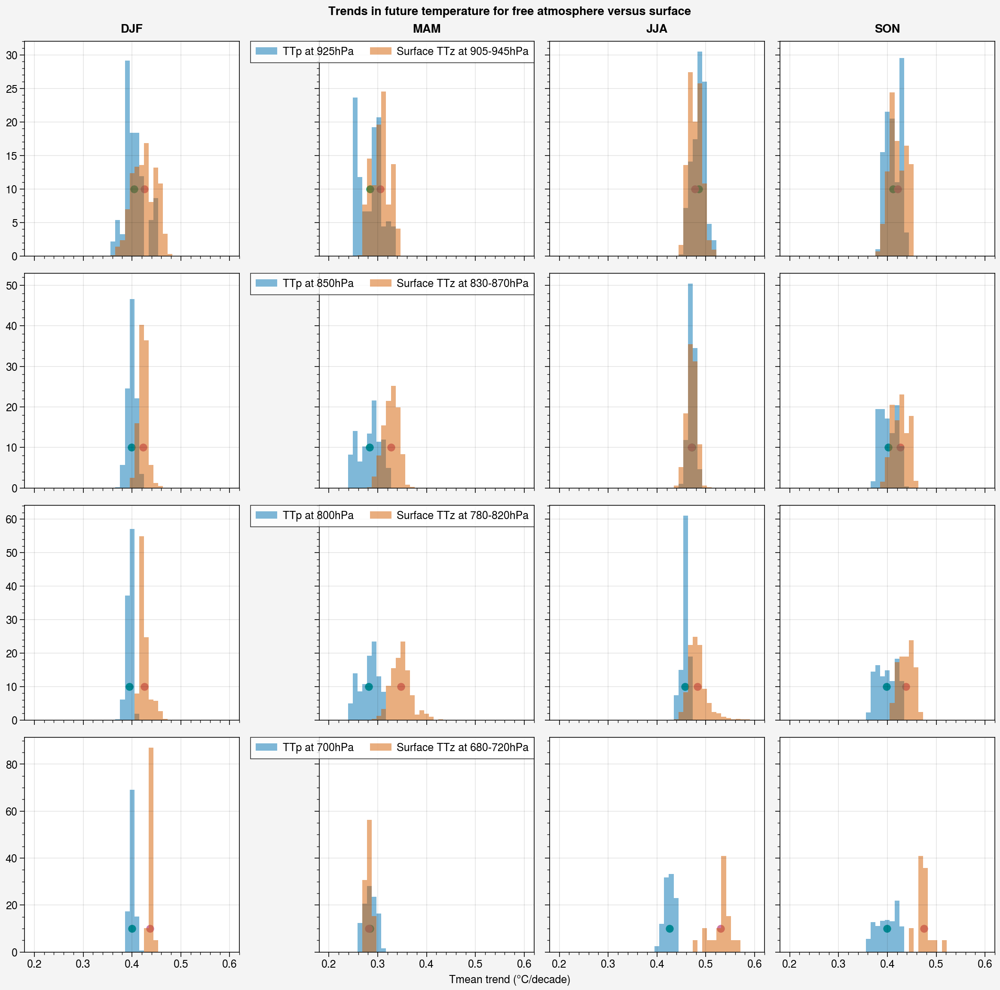

In [22]:
f, axs = pplt.subplots(ncols=4,nrows=4)
leg = [['TTp at 925hPa','TTp at 850hPa','TTp at 800hPa','TTp at 700hPa','TTp at 600hPa'],
       ['Surface TTz at 905-945hPa','Surface TTz at 830-870hPa','Surface TTz at 780-820hPa','Surface TTz at 680-720hPa',
        'Surface TTz at 580-620hPa']]


for i in range(4): # seasons
    for j in range(4): # P levels
        slope_TTp = np.ma.masked_array(slope_TTp_fut[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
        slope_surf = np.ma.masked_array(slope_T_fut[0,i], mask=np.invert(alps_SP[j])).reshape(12649)
        ax = axs[j,i]
        blue_bar = ax.hist(10*slope_TTp,bins=41,range=(0.2,0.6),density=True,alpha=0.5,label=leg[0][j])
        orange_bar = ax.hist(10*slope_surf,bins=41,range=(0.2,0.6),density=True,alpha=0.5,label=leg[1][j])
        
        ax.scatter(10*slope_TTp.mean(),10)
        ax.scatter(10*slope_surf.mean(),10)
        
        if(i == 1):
            ax.legend()
    
    #ax.legend([blue_bar,orange_bar],leg


axs.format(suptitle='Trends in future temperature for free atmosphere versus surface',
           collabels=['DJF','MAM','JJA', 'SON'],xlabel='Tmean trend (°C/decade)')


In [63]:
seasons = ['DJF','MAM','JJA', 'SON']
color_levels = [colors_land[0],colors_land[50],colors_land[100],np.array([0.8,0.8,0.8,1.])]
leg = ['925 hPa','850 hPa','800 hPa','700 hPa']

for P in range(4):
    plt.plot(seasons,8.5*(mean_slope_surf[:,P]-mean_slope_TTp[:,P]),c=color_levels[P],label=leg[P]) # 8.5 décennies ou 85 ans
plt.legend()
plt.title('Difference between Surface and Free-atmosphere warming between 2015 and 2100, for the Alps')
plt.ylabel('°C')

NameError: name 'mean_slope_surf' is not defined

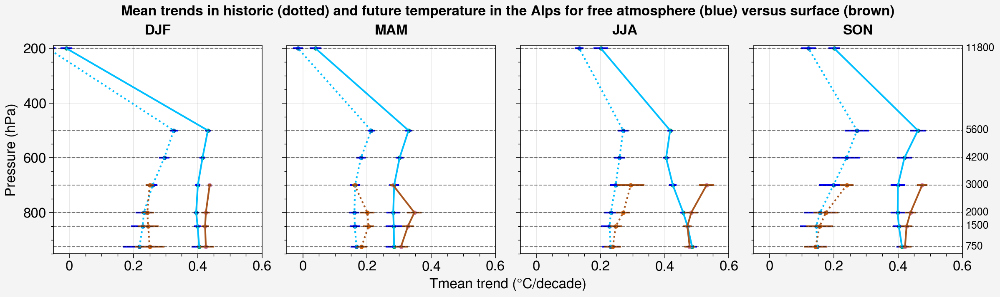

In [62]:
# Both
f, axs = pplt.subplots(ncols=4)

mean_slope_TTp_hist=np.full((4,7),np.nan)
mean_slope_surf_hist=np.full((4,4),np.nan)
std_slope_TTp_hist=np.full((4,7),np.nan)
std_slope_surf_hist=np.full((4,4),np.nan)

mean_slope_TTp_fut=np.full((4,7),np.nan)
mean_slope_surf_fut=np.full((4,4),np.nan)
std_slope_TTp_fut=np.full((4,7),np.nan)
std_slope_surf_fut=np.full((4,4),np.nan)

pressure4 = [925,850,800,700]
pressure = [925,850,800,700,600,500,200]

for i in range(4): # seasons
    ax = axs[i]
    for j in range(7): # P levels
        slope_TTp_hist_msk = np.ma.masked_array(slope_TTp_hist[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
        mean_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.mean()
        std_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.std()
        ax.plot([10*slope_TTp_hist_msk.mean()-10*slope_TTp_hist_msk.std(),10*slope_TTp_hist_msk.mean()+10*slope_TTp_hist_msk.std()],
                [pressure[j],pressure[j]],c='b')
        
        slope_TTp_fut_msk = np.ma.masked_array(slope_TTp_fut[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
        mean_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.mean()
        std_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.std()
        ax.plot([10*slope_TTp_fut_msk.mean()-10*slope_TTp_fut_msk.std(),10*slope_TTp_fut_msk.mean()+10*slope_TTp_fut_msk.std()],
                [pressure[j],pressure[j]],c='b')
        
        if j<4:
            slope_surf_hist = np.ma.masked_array(slope_T_hist[0,i], mask=np.invert(alps_SP[j])).reshape(12649)
            mean_slope_surf_hist[i,j] = 10*slope_surf_hist.mean()
            std_slope_surf_hist[i,j] = 10*slope_surf_hist.std()
            ax.plot([10*slope_surf_hist.mean()-10*slope_surf_hist.std(),10*slope_surf_hist.mean()+10*slope_surf_hist.std()],
                    [pressure[j],pressure[j]],c='sienna')
            
            slope_surf_fut = np.ma.masked_array(slope_T_fut[0,i], mask=np.invert(alps_SP[j])).reshape(12649)
            mean_slope_surf_fut[i,j] = 10*slope_surf_fut.mean()
            std_slope_surf_fut[i,j] = 10*slope_surf_fut.std()
            ax.plot([10*slope_surf_fut.mean()-10*slope_surf_fut.std(),10*slope_surf_fut.mean()+10*slope_surf_fut.std()],
                    [pressure[j],pressure[j]],c='sienna')
    
    ax.plot(mean_slope_TTp_hist[i,:],pressure,label='Free atmosphere',linestyle=':',c='deepskyblue')
    ax.plot(mean_slope_surf_hist[i,:],pressure4,label='Surface',linestyle=':',c='sienna')
    ax.scatter(mean_slope_TTp_hist[i,:],pressure,label='Free atmosphere',s=10)
    ax.scatter(mean_slope_surf_hist[i,:],pressure4,label='Surface',s=10)
    
    ax.plot(mean_slope_TTp_fut[i,:],pressure,label='Free atmosphere',c='deepskyblue')
    ax.plot(mean_slope_surf_fut[i,:],pressure4,label='Surface',c='sienna')
    ax.scatter(mean_slope_TTp_fut[i,:],pressure,label='Free atmosphere',s=10)
    ax.scatter(mean_slope_surf_fut[i,:],pressure4,label='Surface',s=10)
    
    ax.plot([-0.05,0.6],[925,925],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
    ax.plot([-0.05,0.6],[850,850],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
    ax.plot([-0.05,0.6],[800,800],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
    ax.plot([-0.05,0.6],[700,700],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
    ax.plot([-0.05,0.6],[600,600],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
    ax.plot([-0.05,0.6],[500,500],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
    ax.plot([-0.05,0.6],[200,200],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
    
    if i==3:
        ax.text(0.61, 935, "750", fontsize=9)
        ax.text(0.61, 860, "1500", fontsize=9)
        ax.text(0.61, 810, "2000", fontsize=9)
        ax.text(0.61, 710, "3000", fontsize=9)
        ax.text(0.61, 610, "4200", fontsize=9)
        ax.text(0.61, 510, "5600", fontsize=9)
        ax.text(0.61, 210, "11800", fontsize=9)
    
    ax.set_xlim(-0.05,0.6)
    ax.set_ylim(950,190)
        
    #if(i == 1):
    #    ax.legend()
    
    #ax.legend([blue_bar,orange_bar],leg


axs.format(suptitle='Mean trends in historic (dotted) and future temperature in the Alps for free atmosphere (blue) versus surface (brown)',
           collabels=['DJF','MAM','JJA', 'SON'],xlabel='Tmean trend (°C/decade)',ylabel='Pressure (hPa)')

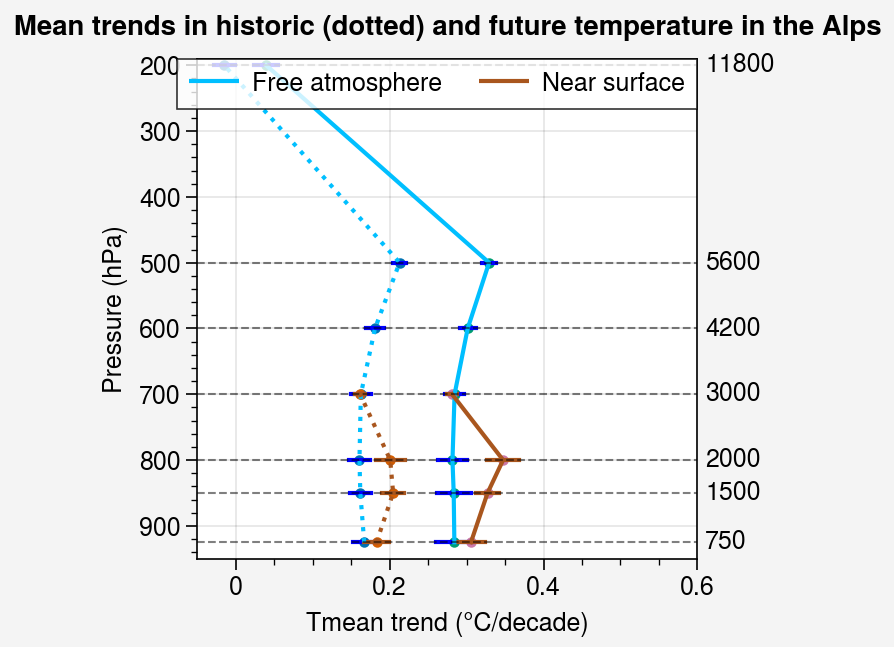

In [24]:
# Both
f, ax = pplt.subplots(ncols=1)

mean_slope_TTp_hist=np.full((4,7),np.nan)
mean_slope_surf_hist=np.full((4,4),np.nan)
std_slope_TTp_hist=np.full((4,7),np.nan)
std_slope_surf_hist=np.full((4,4),np.nan)

mean_slope_TTp_fut=np.full((4,7),np.nan)
mean_slope_surf_fut=np.full((4,4),np.nan)
std_slope_TTp_fut=np.full((4,7),np.nan)
std_slope_surf_fut=np.full((4,4),np.nan)

pressure4 = [925,850,800,700]
pressure = [925,850,800,700,600,500,200]

i=1
for j in range(7): # P levels
    slope_TTp_hist_msk = np.ma.masked_array(slope_TTp_hist[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
    mean_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.mean()
    std_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.std()
    ax.plot([10*slope_TTp_hist_msk.mean()-10*slope_TTp_hist_msk.std(),10*slope_TTp_hist_msk.mean()+10*slope_TTp_hist_msk.std()],
            [pressure[j],pressure[j]],c='b')
    
    slope_TTp_fut_msk = np.ma.masked_array(slope_TTp_fut[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
    mean_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.mean()
    std_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.std()
    ax.plot([10*slope_TTp_fut_msk.mean()-10*slope_TTp_fut_msk.std(),10*slope_TTp_fut_msk.mean()+10*slope_TTp_fut_msk.std()],
            [pressure[j],pressure[j]],c='b')
    
    if j<4:
        slope_surf_hist = np.ma.masked_array(slope_T_hist[0,i], mask=np.invert(alps_SP[j])).reshape(12649)
        mean_slope_surf_hist[i,j] = 10*slope_surf_hist.mean()
        std_slope_surf_hist[i,j] = 10*slope_surf_hist.std()
        ax.plot([10*slope_surf_hist.mean()-10*slope_surf_hist.std(),10*slope_surf_hist.mean()+10*slope_surf_hist.std()],
                [pressure[j],pressure[j]],c='sienna')
        
        slope_surf_fut = np.ma.masked_array(slope_T_fut[0,i], mask=np.invert(alps_SP[j])).reshape(12649)
        mean_slope_surf_fut[i,j] = 10*slope_surf_fut.mean()
        std_slope_surf_fut[i,j] = 10*slope_surf_fut.std()
        ax.plot([10*slope_surf_fut.mean()-10*slope_surf_fut.std(),10*slope_surf_fut.mean()+10*slope_surf_fut.std()],
                [pressure[j],pressure[j]],c='sienna')

ax.plot(mean_slope_TTp_hist[i,:],pressure,linestyle=':',c='deepskyblue')
ax.plot(mean_slope_surf_hist[i,:],pressure4,linestyle=':',c='sienna')
ax.scatter(mean_slope_TTp_hist[i,:],pressure,s=10)
ax.scatter(mean_slope_surf_hist[i,:],pressure4,s=10)

ax.plot(mean_slope_TTp_fut[i,:],pressure,label='Free atmosphere',c='deepskyblue')
ax.plot(mean_slope_surf_fut[i,:],pressure4,label='Near surface',c='sienna')
ax.scatter(mean_slope_TTp_fut[i,:],pressure,s=10)
ax.scatter(mean_slope_surf_fut[i,:],pressure4,s=10)

ax.plot([-0.05,0.6],[925,925],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
ax.plot([-0.05,0.6],[850,850],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
ax.plot([-0.05,0.6],[800,800],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
ax.plot([-0.05,0.6],[700,700],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
ax.plot([-0.05,0.6],[600,600],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
ax.plot([-0.05,0.6],[500,500],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
ax.plot([-0.05,0.6],[200,200],linestyle='--',c='k',linewidth=0.75,alpha=0.5)

ax.text(0.61, 935, "750", fontsize=9)
ax.text(0.61, 860, "1500", fontsize=9)
ax.text(0.61, 810, "2000", fontsize=9)
ax.text(0.61, 710, "3000", fontsize=9)
ax.text(0.61, 610, "4200", fontsize=9)
ax.text(0.61, 510, "5600", fontsize=9)
ax.text(0.61, 210, "11800", fontsize=9)

ax.set_xlim(-0.05,0.6)
ax.set_ylim(950,190)

ax.legend()

ax.format(suptitle='Mean trends in historic (dotted) and future temperature in the Alps',
           xlabel='Tmean trend (°C/decade)',ylabel='Pressure (hPa)')

/tmp/ipykernel_1754733/1175538326.py:84: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=12)
/tmp/ipykernel_1754733/1175538326.py:84: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=12)


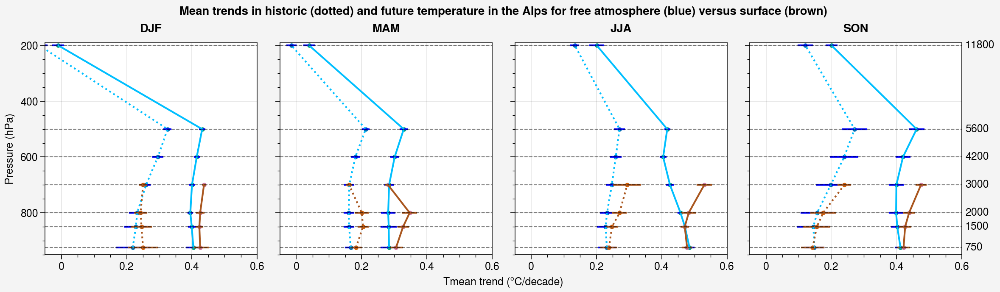

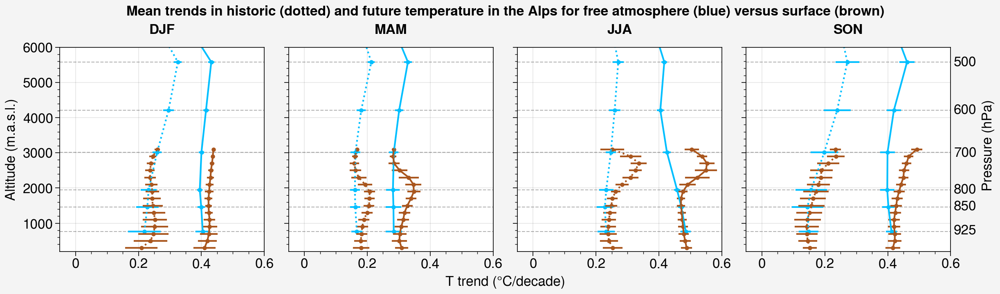

In [36]:
# Both
f, axs = pplt.subplots(ncols=4)

mean_slope_TTp_hist=np.full((4,7),np.nan)
mean_slope_surf_hist=np.full((4,4),np.nan)
std_slope_TTp_hist=np.full((4,7),np.nan)
std_slope_surf_hist=np.full((4,4),np.nan)

mean_slope_TTp_fut=np.full((4,7),np.nan)
mean_slope_surf_fut=np.full((4,4),np.nan)
std_slope_TTp_fut=np.full((4,7),np.nan)
std_slope_surf_fut=np.full((4,4),np.nan)

pressure4 = [925,850,800,700]
pressure = [925,850,800,700,600,500,200]

for i in range(4): # seasons
    ax = axs[i]
    for j in range(7): # P levels
        slope_TTp_hist_msk = np.ma.masked_array(slope_TTp_hist[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
        mean_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.mean()
        std_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.std()
        ax.plot([10*slope_TTp_hist_msk.mean()-10*slope_TTp_hist_msk.std(),10*slope_TTp_hist_msk.mean()+10*slope_TTp_hist_msk.std()],
                [pressure[j],pressure[j]],c='b')
        
        slope_TTp_fut_msk = np.ma.masked_array(slope_TTp_fut[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
        mean_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.mean()
        std_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.std()
        ax.plot([10*slope_TTp_fut_msk.mean()-10*slope_TTp_fut_msk.std(),10*slope_TTp_fut_msk.mean()+10*slope_TTp_fut_msk.std()],
                [pressure[j],pressure[j]],c='b')
        
        if j<4:
            slope_surf_hist = np.ma.masked_array(slope_T_hist[0,i], mask=np.invert(alps_SP[j])).reshape(12649)
            mean_slope_surf_hist[i,j] = 10*slope_surf_hist.mean()
            std_slope_surf_hist[i,j] = 10*slope_surf_hist.std()
            ax.plot([10*slope_surf_hist.mean()-10*slope_surf_hist.std(),10*slope_surf_hist.mean()+10*slope_surf_hist.std()],
                    [pressure[j],pressure[j]],c='sienna')
            
            slope_surf_fut = np.ma.masked_array(slope_T_fut[0,i], mask=np.invert(alps_SP[j])).reshape(12649)
            mean_slope_surf_fut[i,j] = 10*slope_surf_fut.mean()
            std_slope_surf_fut[i,j] = 10*slope_surf_fut.std()
            ax.plot([10*slope_surf_fut.mean()-10*slope_surf_fut.std(),10*slope_surf_fut.mean()+10*slope_surf_fut.std()],
                    [pressure[j],pressure[j]],c='sienna')
    
    ax.plot(mean_slope_TTp_hist[i,:],pressure,label='Free atmosphere',linestyle=':',c='deepskyblue')
    ax.plot(mean_slope_surf_hist[i,:],pressure4,label='Surface',linestyle=':',c='sienna')
    ax.scatter(mean_slope_TTp_hist[i,:],pressure,label='Free atmosphere',s=10)
    ax.scatter(mean_slope_surf_hist[i,:],pressure4,label='Surface',s=10)
    
    ax.plot(mean_slope_TTp_fut[i,:],pressure,label='Free atmosphere',c='deepskyblue')
    ax.plot(mean_slope_surf_fut[i,:],pressure4,label='Surface',c='sienna')
    ax.scatter(mean_slope_TTp_fut[i,:],pressure,label='Free atmosphere',s=10)
    ax.scatter(mean_slope_surf_fut[i,:],pressure4,label='Surface',s=10)
    
    ax.plot([-0.05,0.6],[925,925],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
    ax.plot([-0.05,0.6],[850,850],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
    ax.plot([-0.05,0.6],[800,800],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
    ax.plot([-0.05,0.6],[700,700],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
    ax.plot([-0.05,0.6],[600,600],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
    ax.plot([-0.05,0.6],[500,500],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
    ax.plot([-0.05,0.6],[200,200],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
    
    if i==3:
        ax.text(0.61, 935, "750", fontsize=9)
        ax.text(0.61, 860, "1500", fontsize=9)
        ax.text(0.61, 810, "2000", fontsize=9)
        ax.text(0.61, 710, "3000", fontsize=9)
        ax.text(0.61, 610, "4200", fontsize=9)
        ax.text(0.61, 510, "5600", fontsize=9)
        ax.text(0.61, 210, "11800", fontsize=9)
    
    ax.set_xlim(-0.05,0.6)
    ax.set_ylim(950,190)
        
    #if(i == 1):
    #    ax.legend()
    
    #ax.legend([blue_bar,orange_bar],leg


axs.format(suptitle='Mean trends in historic (dotted) and future temperature in the Alps for free atmosphere (blue) versus surface (brown)',
           collabels=['DJF','MAM','JJA', 'SON'],xlabel='Tmean trend (°C/decade)',ylabel='Pressure (hPa)')

pplt.rc.update(small=12, large=12)

# Both
f, axs = pplt.subplots(ncols=4)

n_levels=len(levels)
n_seas=4
n_plevels=len(pressure)

mean_slope_surf_hist=np.full((n_seas,n_levels),np.nan)
mean_slope_TTp_hist=np.full((n_seas,n_plevels),np.nan)
std_slope_surf_hist=np.full((n_seas,n_levels),np.nan)
std_slope_TTp_hist=np.full((n_seas,n_plevels),np.nan)

mean_slope_surf_fut=np.full((n_seas,n_levels),np.nan)
mean_slope_TTp_fut=np.full((n_seas,n_plevels),np.nan)
std_slope_surf_fut=np.full((n_seas,n_levels),np.nan)
std_slope_TTp_fut=np.full((n_seas,n_plevels),np.nan)


for i in range(4): # seasons
    ax = axs[i]
    for m in range(n_plevels):
        ax.plot([-0.05,0.6],[H_levels_pressure[m],H_levels_pressure[m]],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    
    for j in range(n_levels): # P levels

        slope_surf_hist = np.ma.masked_array(slope_T_hist[0,i], mask=np.invert(levels[j])).reshape(12649)
        mean_slope_surf_hist[i,j] = 10*slope_surf_hist.mean()
        std_slope_surf_hist[i,j] = 10*slope_surf_hist.std()
        ax.plot([10*slope_surf_hist.mean()-10*slope_surf_hist.std(),10*slope_surf_hist.mean()+10*slope_surf_hist.std()],
                [H_levels[j],H_levels[j]],c='sienna')
        
        slope_surf_fut = np.ma.masked_array(slope_T_fut[0,i], mask=np.invert(levels[j])).reshape(12649)
        mean_slope_surf_fut[i,j] = 10*slope_surf_fut.mean()
        std_slope_surf_fut[i,j] = 10*slope_surf_fut.std()
        ax.plot([10*slope_surf_fut.mean()-10*slope_surf_fut.std(),10*slope_surf_fut.mean()+10*slope_surf_fut.std()],
                [H_levels[j],H_levels[j]],c='sienna')
        
        if j<n_plevels:
            slope_TTp_hist_msk = np.ma.masked_array(slope_TTp_hist[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
            mean_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.mean()
            std_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.std()
            ax.plot([10*slope_TTp_hist_msk.mean()-10*slope_TTp_hist_msk.std(),10*slope_TTp_hist_msk.mean()+10*slope_TTp_hist_msk.std()],
                [H_levels_pressure[j],H_levels_pressure[j]],c='deepskyblue')
            
            slope_TTp_fut_msk = np.ma.masked_array(slope_TTp_fut[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
            mean_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.mean()
            std_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.std()
            ax.plot([10*slope_TTp_fut_msk.mean()-10*slope_TTp_fut_msk.std(),10*slope_TTp_fut_msk.mean()+10*slope_TTp_fut_msk.std()],
                [H_levels_pressure[j],H_levels_pressure[j]],c='deepskyblue')
            
            
    ax.plot(mean_slope_TTp_hist[i,:],H_levels_pressure,label='Free atmosphere',linestyle=':',c='deepskyblue')
    ax.plot(mean_slope_surf_hist[i,:],H_levels,label='Surface',linestyle=':',c='sienna')
    ax.scatter(mean_slope_TTp_hist[i,:],H_levels_pressure,label='Free atmosphere',s=10,c='deepskyblue')
    ax.scatter(mean_slope_surf_hist[i,:],H_levels,label='Surface',s=10,c='sienna')
    
    ax.plot(mean_slope_TTp_fut[i,:],H_levels_pressure,label='Free atmosphere',c='deepskyblue')
    ax.plot(mean_slope_surf_fut[i,:],H_levels,label='Surface',c='sienna')
    ax.scatter(mean_slope_TTp_fut[i,:],H_levels_pressure,label='Free atmosphere',s=10,c='deepskyblue')
    ax.scatter(mean_slope_surf_fut[i,:],H_levels,label='Surface',s=10,c='sienna')
    
    
    if i==3:
        ax.text(0.61, 680, "925", fontsize=12)
        ax.text(0.61, 1370, "850", fontsize=12)
        ax.text(0.61, 1850, "800", fontsize=12)
        ax.text(0.61, 2890, "700", fontsize=12)
        ax.text(0.61, 4110, "600", fontsize=12)
        ax.text(0.61, 5460, "500", fontsize=12)
        #ax.text(0.61, 11650, "200", fontsize=9)
        ax.text(0.7,2000,'Pressure (hPa)',rotation='vertical',fontsize=12)
    
    ax.set_xlim(-0.05,0.6)
    ax.set_ylim(200,6000)


axs.format(suptitle='Mean trends in historic (dotted) and future temperature in the Alps for free atmosphere (blue) versus surface (brown)',
           collabels=['DJF','MAM','JJA', 'SON'],xlabel='T trend (°C/decade)',ylabel='Altitude (m.a.s.l.)')

/tmp/ipykernel_3496612/1817220365.py:2: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=14, large=12)
/tmp/ipykernel_3496612/1817220365.py:2: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=14, large=12)


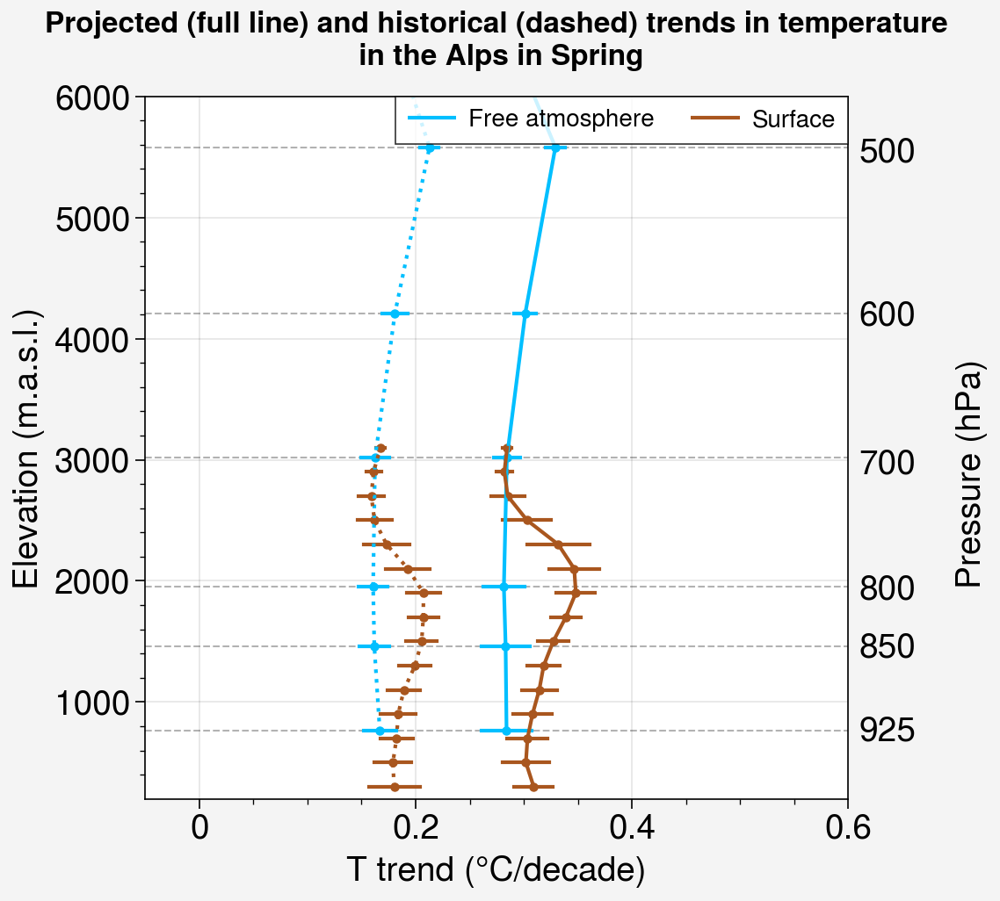

In [28]:
f, axs = pplt.subplots(ncols=1,axwidth = 4)
pplt.rc.update(small=14, large=12)

n_levels=len(levels)
n_seas=4
n_plevels=len(pressure)

mean_slope_surf_hist=np.full((n_seas,n_levels),np.nan)
mean_slope_TTp_hist=np.full((n_seas,n_plevels),np.nan)
std_slope_surf_hist=np.full((n_seas,n_levels),np.nan)
std_slope_TTp_hist=np.full((n_seas,n_plevels),np.nan)

mean_slope_surf_fut=np.full((n_seas,n_levels),np.nan)
mean_slope_TTp_fut=np.full((n_seas,n_plevels),np.nan)
std_slope_surf_fut=np.full((n_seas,n_levels),np.nan)
std_slope_TTp_fut=np.full((n_seas,n_plevels),np.nan)


i=1 # seasons
ax = axs[0]
for m in range(n_plevels):
    ax.plot([-0.05,0.6],[H_levels_pressure[m],H_levels_pressure[m]],linestyle='--',c='k',linewidth=0.75,alpha=0.3)

for j in range(n_levels): # P levels
    slope_surf_hist = np.ma.masked_array(slope_T_hist[0,i], mask=np.invert(levels[j])).reshape(12649)
    mean_slope_surf_hist[i,j] = 10*slope_surf_hist.mean()
    std_slope_surf_hist[i,j] = 10*slope_surf_hist.std()
    ax.plot([10*slope_surf_hist.mean()-10*slope_surf_hist.std(),10*slope_surf_hist.mean()+10*slope_surf_hist.std()],
            [H_levels[j],H_levels[j]],c='sienna')
        
    slope_surf_fut = np.ma.masked_array(slope_T_fut[0,i], mask=np.invert(levels[j])).reshape(12649)
    mean_slope_surf_fut[i,j] = 10*slope_surf_fut.mean()
    std_slope_surf_fut[i,j] = 10*slope_surf_fut.std()
    ax.plot([10*slope_surf_fut.mean()-10*slope_surf_fut.std(),10*slope_surf_fut.mean()+10*slope_surf_fut.std()],
            [H_levels[j],H_levels[j]],c='sienna')
        
    if j<n_plevels:
        slope_TTp_hist_msk = np.ma.masked_array(slope_TTp_hist[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
        mean_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.mean()
        std_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.std()
        ax.plot([10*slope_TTp_hist_msk.mean()-10*slope_TTp_hist_msk.std(),10*slope_TTp_hist_msk.mean()+10*slope_TTp_hist_msk.std()],
            [H_levels_pressure[j],H_levels_pressure[j]],c='deepskyblue')
            
        slope_TTp_fut_msk = np.ma.masked_array(slope_TTp_fut[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
        mean_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.mean()
        std_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.std()
        ax.plot([10*slope_TTp_fut_msk.mean()-10*slope_TTp_fut_msk.std(),10*slope_TTp_fut_msk.mean()+10*slope_TTp_fut_msk.std()],
            [H_levels_pressure[j],H_levels_pressure[j]],c='deepskyblue')
            
            
ax.plot(mean_slope_TTp_hist[i,:],H_levels_pressure,linestyle=':',c='deepskyblue')
ax.plot(mean_slope_surf_hist[i,:],H_levels,linestyle=':',c='sienna')
ax.scatter(mean_slope_TTp_hist[i,:],H_levels_pressure,s=10,c='deepskyblue')
ax.scatter(mean_slope_surf_hist[i,:],H_levels,s=10,c='sienna')

ax.plot(mean_slope_TTp_fut[i,:],H_levels_pressure,label='Free atmosphere',c='deepskyblue')
ax.plot(mean_slope_surf_fut[i,:],H_levels,label='Surface',c='sienna')
ax.scatter(mean_slope_TTp_fut[i,:],H_levels_pressure,s=10,c='deepskyblue')
ax.scatter(mean_slope_surf_fut[i,:],H_levels,s=10,c='sienna')
    
    

ax.text(0.61, 680, "925", fontsize=14)
ax.text(0.61, 1370, "850", fontsize=14)
ax.text(0.61, 1850, "800", fontsize=14)
ax.text(0.61, 2890, "700", fontsize=14)
ax.text(0.61, 4110, "600", fontsize=14)
ax.text(0.61, 5460, "500", fontsize=14)
#ax.text(0.61, 11650, "200", fontsize=9)
ax.text(0.7,2000,'Pressure (hPa)',rotation='vertical',fontsize=14)
   
ax.set_xlim(-0.05,0.6)
ax.set_ylim(200,6000)

axs.legend(prop = { "size": 10 })
axs.format(suptitle='Projected (full line) and historical (dashed) trends in temperature\n in the Alps in Spring',
           xlabel='T trend (°C/decade)',ylabel='Elevation (m.a.s.l.)')

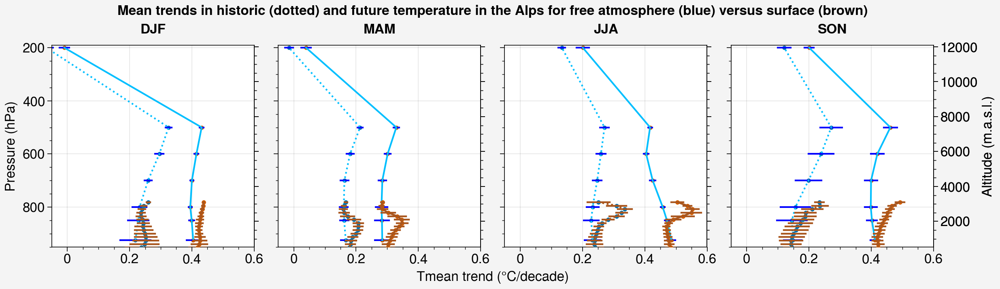

In [39]:
# Both
f, axs = pplt.subplots(ncols=4)

n_levels=len(levels)
n_seas=4
n_plevels=len(pressure)

mean_slope_surf_hist=np.full((n_seas,n_levels),np.nan)
mean_slope_TTp_hist=np.full((n_seas,n_plevels),np.nan)
std_slope_surf_hist=np.full((n_seas,n_levels),np.nan)
std_slope_TTp_hist=np.full((n_seas,n_plevels),np.nan)

mean_slope_surf_fut=np.full((n_seas,n_levels),np.nan)
mean_slope_TTp_fut=np.full((n_seas,n_plevels),np.nan)
std_slope_surf_fut=np.full((n_seas,n_levels),np.nan)
std_slope_TTp_fut=np.full((n_seas,n_plevels),np.nan)


for i in range(4): # seasons
    ax = axs[i]
    ax2 = ax.twinx()
    for j in range(n_levels): # P levels

        slope_surf_hist = np.ma.masked_array(slope_T_hist[0,i], mask=np.invert(levels[j])).reshape(12649)
        mean_slope_surf_hist[i,j] = 10*slope_surf_hist.mean()
        std_slope_surf_hist[i,j] = 10*slope_surf_hist.std()
        ax2.plot([10*slope_surf_hist.mean()-10*slope_surf_hist.std(),10*slope_surf_hist.mean()+10*slope_surf_hist.std()],
                [H_levels[j],H_levels[j]],c='sienna')
        
        slope_surf_fut = np.ma.masked_array(slope_T_fut[0,i], mask=np.invert(levels[j])).reshape(12649)
        mean_slope_surf_fut[i,j] = 10*slope_surf_fut.mean()
        std_slope_surf_fut[i,j] = 10*slope_surf_fut.std()
        ax2.plot([10*slope_surf_fut.mean()-10*slope_surf_fut.std(),10*slope_surf_fut.mean()+10*slope_surf_fut.std()],
                [H_levels[j],H_levels[j]],c='sienna')
        
        if j<n_plevels:
            slope_TTp_hist_msk = np.ma.masked_array(slope_TTp_hist[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
            mean_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.mean()
            std_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.std()
            ax.plot([10*slope_TTp_hist_msk.mean()-10*slope_TTp_hist_msk.std(),10*slope_TTp_hist_msk.mean()+10*slope_TTp_hist_msk.std()],
                [pressure[j],pressure[j]],c='b')
            
            slope_TTp_fut_msk = np.ma.masked_array(slope_TTp_fut[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
            mean_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.mean()
            std_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.std()
            ax.plot([10*slope_TTp_fut_msk.mean()-10*slope_TTp_fut_msk.std(),10*slope_TTp_fut_msk.mean()+10*slope_TTp_fut_msk.std()],
                [pressure[j],pressure[j]],c='b')
            
            
    ax.plot(mean_slope_TTp_hist[i,:],pressure,label='Free atmosphere',linestyle=':',c='deepskyblue')
    ax2.plot(mean_slope_surf_hist[i,:],H_levels,label='Surface',linestyle=':',c='sienna')
    ax.scatter(mean_slope_TTp_hist[i,:],pressure,label='Free atmosphere',s=10)
    ax2.scatter(mean_slope_surf_hist[i,:],H_levels,label='Surface',s=10)
    
    ax.plot(mean_slope_TTp_fut[i,:],pressure,label='Free atmosphere',c='deepskyblue')
    ax2.plot(mean_slope_surf_fut[i,:],H_levels,label='Surface',c='sienna')
    ax.scatter(mean_slope_TTp_fut[i,:],pressure,label='Free atmosphere',s=10)
    ax2.scatter(mean_slope_surf_fut[i,:],H_levels,label='Surface',s=10)
    
    ax.set_xlim(-0.05,0.6)
    ax.set_ylim(950,190)
    ax2.set_ylim(540,12100)
        
    if(i < 3):
        ax2.yaxis.set_tick_params(labelright=False)
    
    #ax.legend([blue_bar,orange_bar],leg

ax2.format(ylabel='Altitude (m.a.s.l.)')
axs.format(suptitle='Mean trends in historic (dotted) and future temperature in the Alps for free atmosphere (blue) versus surface (brown)',
           collabels=['DJF','MAM','JJA', 'SON'],xlabel='Tmean trend (°C/decade)',ylabel='Pressure (hPa)')

/tmp/ipykernel_262742/2672751863.py:3: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=12)
/tmp/ipykernel_262742/2672751863.py:3: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=12)


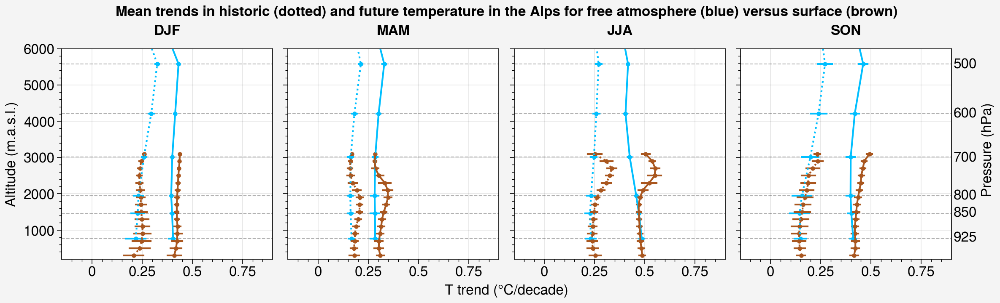

In [116]:
# Plot pour comparaison MPI (mêmes xlims)

pplt.rc.update(small=12, large=12)

# Both
f, axs = pplt.subplots(ncols=4)

n_levels=len(levels)
n_seas=4
n_plevels=len(pressure)

mean_slope_surf_hist=np.full((n_seas,n_levels),np.nan)
mean_slope_TTp_hist=np.full((n_seas,n_plevels),np.nan)
std_slope_surf_hist=np.full((n_seas,n_levels),np.nan)
std_slope_TTp_hist=np.full((n_seas,n_plevels),np.nan)

mean_slope_surf_fut=np.full((n_seas,n_levels),np.nan)
mean_slope_TTp_fut=np.full((n_seas,n_plevels),np.nan)
std_slope_surf_fut=np.full((n_seas,n_levels),np.nan)
std_slope_TTp_fut=np.full((n_seas,n_plevels),np.nan)


for i in range(4): # seasons
    ax = axs[i]
    for m in range(n_plevels):
        ax.plot([-0.15,0.9],[H_levels_pressure[m],H_levels_pressure[m]],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    
    for j in range(n_levels): 

        slope_surf_hist = np.ma.masked_array(slope_T_hist[0,i], mask=np.invert(levels[j])).reshape(12649)
        mean_slope_surf_hist[i,j] = 10*slope_surf_hist.mean()
        std_slope_surf_hist[i,j] = 10*slope_surf_hist.std()
        ax.plot([10*slope_surf_hist.mean()-10*slope_surf_hist.std(),10*slope_surf_hist.mean()+10*slope_surf_hist.std()],
                [H_levels[j],H_levels[j]],c='sienna')
        
        slope_surf_fut = np.ma.masked_array(slope_T_fut[0,i], mask=np.invert(levels[j])).reshape(12649)
        mean_slope_surf_fut[i,j] = 10*slope_surf_fut.mean()
        std_slope_surf_fut[i,j] = 10*slope_surf_fut.std()
        ax.plot([10*slope_surf_fut.mean()-10*slope_surf_fut.std(),10*slope_surf_fut.mean()+10*slope_surf_fut.std()],
                [H_levels[j],H_levels[j]],c='sienna')
        
        if j<n_plevels: # P levels
            slope_TTp_hist_msk = np.ma.masked_array(slope_TTp_hist[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
            mean_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.mean()
            std_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.std()
            ax.plot([10*slope_TTp_hist_msk.mean()-10*slope_TTp_hist_msk.std(),10*slope_TTp_hist_msk.mean()+10*slope_TTp_hist_msk.std()],
                [H_levels_pressure[j],H_levels_pressure[j]],c='deepskyblue')
            
            slope_TTp_fut_msk = np.ma.masked_array(slope_TTp_fut[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
            mean_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.mean()
            std_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.std()
            ax.plot([10*slope_TTp_fut_msk.mean()-10*slope_TTp_fut_msk.std(),10*slope_TTp_fut_msk.mean()+10*slope_TTp_fut_msk.std()],
                [H_levels_pressure[j],H_levels_pressure[j]],c='deepskyblue')
            
            
    ax.plot(mean_slope_TTp_hist[i,:],H_levels_pressure,label='Free atmosphere',linestyle=':',c='deepskyblue')
    ax.plot(mean_slope_surf_hist[i,:],H_levels,label='Surface',linestyle=':',c='sienna')
    ax.scatter(mean_slope_TTp_hist[i,:],H_levels_pressure,label='Free atmosphere',s=10,c='deepskyblue')
    ax.scatter(mean_slope_surf_hist[i,:],H_levels,label='Surface',s=10,c='sienna')
    
    ax.plot(mean_slope_TTp_fut[i,:],H_levels_pressure,label='Free atmosphere',c='deepskyblue')
    ax.plot(mean_slope_surf_fut[i,:],H_levels,label='Surface',c='sienna')
    ax.scatter(mean_slope_TTp_fut[i,:],H_levels_pressure,label='Free atmosphere',s=10,c='deepskyblue')
    ax.scatter(mean_slope_surf_fut[i,:],H_levels,label='Surface',s=10,c='sienna')
    
    
    if i==3:
        ax.text(0.91, 680, "925", fontsize=12)
        ax.text(0.91, 1370, "850", fontsize=12)
        ax.text(0.91, 1850, "800", fontsize=12)
        ax.text(0.91, 2890, "700", fontsize=12)
        ax.text(0.91, 4110, "600", fontsize=12)
        ax.text(0.91, 5460, "500", fontsize=12)
        #ax.text(0.61, 11650, "200", fontsize=9)
        ax.text(1.05,2000,'Pressure (hPa)',rotation='vertical',fontsize=12)
    
    ax.set_xlim(-0.15,0.9)
    ax.set_xticks(np.arange(0.,1.,0.25))
    ax.set_ylim(200,6000)


axs.format(suptitle='Mean trends in historic (dotted) and future temperature in the Alps for free atmosphere (blue) versus surface (brown)',
           collabels=['DJF','MAM','JJA', 'SON'],xlabel='T trend (°C/decade)',ylabel='Altitude (m.a.s.l.)')

#### QQp profile

In [40]:
wp_meanseason_meanQQp = np.full((7,140,4,91,139),np.nan)

wp_meanseason_meanQQp[0] = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanQQp_925.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanQQp[1] = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanQQp_850.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanQQp[2] = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanQQp_800.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanQQp[3] = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanQQp_700.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanQQp[4] = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanQQp_600.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanQQp[5] = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanQQp_500.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanQQp[6] = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanQQp_200.npy')[:,:,jmin:jmax,imin:imax]

In [41]:

origin_QQp_hist=np.full((7,4,91,139),np.nan)
slope_QQp_hist=np.full((7,4,91,139),np.nan)
pvalue_QQp_hist=np.full((7,4,91,139),np.nan)

origin_QQp_fut=np.full((7,4,91,139),np.nan)
slope_QQp_fut=np.full((7,4,91,139),np.nan)
pvalue_QQp_fut=np.full((7,4,91,139),np.nan)

# pressures = [925,850,800,700,600,500,200]

for i in range(139):
    # print(str(lon)+'/'+str(les_season_maxT.shape[3]),end=' ')
    print(i,end=' ')
    for j in range(91):
        for season in range(4):
            for P in range(7):
                linregress_hist = linregress(np.arange(54), wp_meanseason_meanQQp[P,:54,season,j,i]) #hist : 1961-2014, 54 years
                origin_QQp_hist[P][season][j][i] = linregress_hist.intercept
                slope_QQp_hist[P][season][j][i] = linregress_hist.slope
                pvalue_QQp_hist[P][season][j][i] = linregress_hist.pvalue
            
                linregress_fut = linregress(np.arange(85), wp_meanseason_meanQQp[P,55:,season,j,i]) #fut : 2015-2100, 85 years
                origin_QQp_fut[P][season][j][i] = linregress_fut.intercept
                slope_QQp_fut[P][season][j][i] = linregress_fut.slope
                pvalue_QQp_fut[P][season][j][i] = linregress_fut.pvalue

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 

Compare with near-surface

In [42]:
# QQz at 2m

wp_meanseason_meanQQz = np.load('/bettik/castelli/data/saved_data_MAR_ECEarth3/wp_meanseason_meanQQz.npy')[:,:,jmin:jmax,imin:imax]

wp_meanseason_meanQQz_hist = wp_meanseason_meanQQz[:54,:,:,:]
wp_meanseason_meanQQz_fut = wp_meanseason_meanQQz[55:,:,:,:]

origin_QQz_hist=np.full(wp_meanseason_meanQQz_hist.shape[1:4],np.nan)
slope_QQz_hist=np.full(wp_meanseason_meanQQz_hist.shape[1:4],np.nan)
pvalue_QQz_hist=np.full(wp_meanseason_meanQQz_hist.shape[1:4],np.nan)

origin_QQz_fut=np.full(wp_meanseason_meanQQz_fut.shape[1:4],np.nan)
slope_QQz_fut=np.full(wp_meanseason_meanQQz_fut.shape[1:4],np.nan)
pvalue_QQz_fut=np.full(wp_meanseason_meanQQz_fut.shape[1:4],np.nan)

for i in range(wp_meanseason_meanQQz_fut.shape[3]):
    # print(str(lon)+'/'+str(les_season_maxT.shape[3]),end=' ')
    for j in range(wp_meanseason_meanQQz_fut.shape[2]):
        for season in range(4):
            linregress_QQz_hist = linregress(np.arange(wp_meanseason_meanQQz_hist.shape[0]), wp_meanseason_meanQQz_hist[:,season,j,i])
            origin_QQz_hist[season][j][i] = linregress_QQz_hist.intercept
            slope_QQz_hist[season][j][i] = linregress_QQz_hist.slope
            pvalue_QQz_hist[season][j][i] = linregress_QQz_hist.pvalue
            
            linregress_QQz_fut = linregress(np.arange(wp_meanseason_meanQQz_fut.shape[0]), wp_meanseason_meanQQz_fut[:,season,j,i])
            origin_QQz_fut[season][j][i] = linregress_QQz_fut.intercept
            slope_QQz_fut[season][j][i] = linregress_QQz_fut.slope
            pvalue_QQz_fut[season][j][i] = linregress_QQz_fut.pvalue

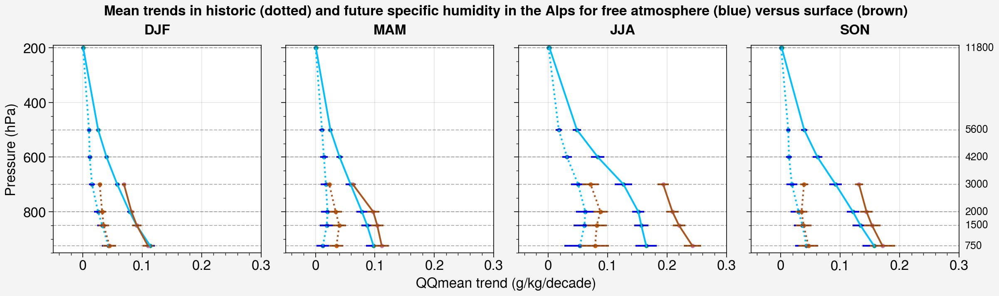

In [43]:
# Both historic and future
f, axs = pplt.subplots(ncols=4)

mean_slope_QQp_hist=np.full((4,7),np.nan)
mean_slope_surf_hist=np.full((4,4),np.nan)
std_slope_QQp_hist=np.full((4,7),np.nan)
std_slope_surf_hist=np.full((4,4),np.nan)

mean_slope_QQp_fut=np.full((4,7),np.nan)
mean_slope_surf_fut=np.full((4,4),np.nan)
std_slope_QQp_fut=np.full((4,7),np.nan)
std_slope_surf_fut=np.full((4,4),np.nan)

pressure4 = [925,850,800,700]
pressure = [925,850,800,700,600,500,200]

for i in range(4): # seasons
    ax = axs[i]
    for j in range(7): # P levels
        slope_QQp_hist_msk = np.ma.masked_array(slope_QQp_hist[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649) # alps_TTp is a mask for
                                                                                                #pressure levels in the Alps, also works for QQp
        mean_slope_QQp_hist[i,j] = 10*slope_QQp_hist_msk.mean()
        std_slope_QQp_hist[i,j] = 10*slope_QQp_hist_msk.std()
        ax.plot([10*slope_QQp_hist_msk.mean()-10*slope_QQp_hist_msk.std(),10*slope_QQp_hist_msk.mean()+10*slope_QQp_hist_msk.std()],
                [pressure[j],pressure[j]],c='b')
        
        slope_QQp_fut_msk = np.ma.masked_array(slope_QQp_fut[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
        mean_slope_QQp_fut[i,j] = 10*slope_QQp_fut_msk.mean()
        std_slope_QQp_fut[i,j] = 10*slope_QQp_fut_msk.std()
        ax.plot([10*slope_QQp_fut_msk.mean()-10*slope_QQp_fut_msk.std(),10*slope_QQp_fut_msk.mean()+10*slope_QQp_fut_msk.std()],
                [pressure[j],pressure[j]],c='b')
        
        if j<4:
            slope_surf_hist = np.ma.masked_array(slope_QQz_hist[i], mask=np.invert(alps_SP[j])).reshape(12649)
            mean_slope_surf_hist[i,j] = 10*slope_surf_hist.mean()
            std_slope_surf_hist[i,j] = 10*slope_surf_hist.std()
            ax.plot([10*slope_surf_hist.mean()-10*slope_surf_hist.std(),10*slope_surf_hist.mean()+10*slope_surf_hist.std()],
                    [pressure[j],pressure[j]],c='sienna')
            
            slope_surf_fut = np.ma.masked_array(slope_QQz_fut[i], mask=np.invert(alps_SP[j])).reshape(12649)
            mean_slope_surf_fut[i,j] = 10*slope_surf_fut.mean()
            std_slope_surf_fut[i,j] = 10*slope_surf_fut.std()
            ax.plot([10*slope_surf_fut.mean()-10*slope_surf_fut.std(),10*slope_surf_fut.mean()+10*slope_surf_fut.std()],
                    [pressure[j],pressure[j]],c='sienna')
    
    ax.plot(mean_slope_QQp_hist[i,:],pressure,label='Free atmosphere',linestyle=':',c='deepskyblue')
    ax.plot(mean_slope_surf_hist[i,:],pressure4,label='Surface',linestyle=':',c='sienna')
    ax.scatter(mean_slope_QQp_hist[i,:],pressure,label='Free atmosphere',s=10)
    ax.scatter(mean_slope_surf_hist[i,:],pressure4,label='Surface',s=10)
    
    ax.plot(mean_slope_QQp_fut[i,:],pressure,label='Free atmosphere',c='deepskyblue')
    ax.plot(mean_slope_surf_fut[i,:],pressure4,label='Surface',c='sienna')
    ax.scatter(mean_slope_QQp_fut[i,:],pressure,label='Free atmosphere',s=10)
    ax.scatter(mean_slope_surf_fut[i,:],pressure4,label='Surface',s=10)
    
    ax.plot([-0.05,0.6],[925,925],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    ax.plot([-0.05,0.6],[850,850],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    ax.plot([-0.05,0.6],[800,800],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    ax.plot([-0.05,0.6],[700,700],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    ax.plot([-0.05,0.6],[600,600],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    ax.plot([-0.05,0.6],[500,500],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    ax.plot([-0.05,0.6],[200,200],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    
    if i==3:
        ax.text(0.31, 935, "750", fontsize=9)
        ax.text(0.31, 860, "1500", fontsize=9)
        ax.text(0.31, 810, "2000", fontsize=9)
        ax.text(0.31, 710, "3000", fontsize=9)
        ax.text(0.31, 610, "4200", fontsize=9)
        ax.text(0.31, 510, "5600", fontsize=9)
        ax.text(0.31, 210, "11800", fontsize=9)
    
    ax.set_xlim(-0.05,0.3)
    ax.set_ylim(950,190)
        
    #if(i == 1):
    #    ax.legend()
    
    #ax.legend([blue_bar,orange_bar],leg


axs.format(suptitle='Mean trends in historic (dotted) and future specific humidity in the Alps for free atmosphere (blue) versus surface (brown)',
           collabels=['DJF','MAM','JJA', 'SON'],xlabel='QQmean trend (g/kg/decade)',ylabel='Pressure (hPa)')

In [44]:
meanQQz_hist = wp_meanseason_meanQQz_hist.mean(axis=0)
meanQQz_fut = wp_meanseason_meanQQz_fut.mean(axis=0)

wp_meanseason_meanQQp_hist = wp_meanseason_meanQQp[:,:54,:,:,:]
wp_meanseason_meanQQp_fut = wp_meanseason_meanQQp[:,55:,:,:,:]
meanQQp_hist = wp_meanseason_meanQQp_hist.mean(axis=1)
meanQQp_fut = wp_meanseason_meanQQp_fut.mean(axis=1)

In [45]:
slope_QQp_hist.shape

(7, 4, 91, 139)

In [46]:
meanQQp_hist.shape

(7, 4, 91, 139)

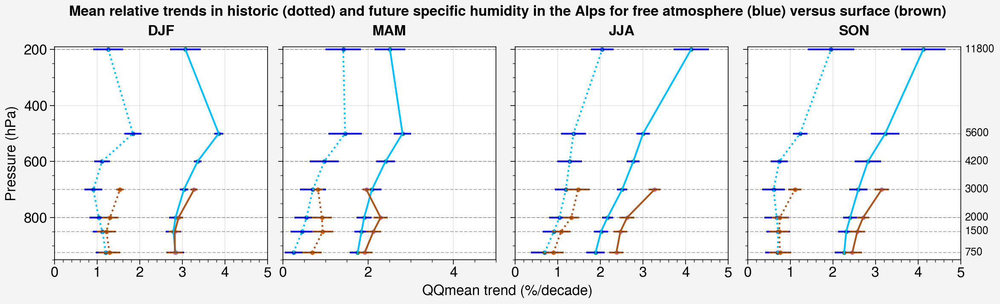

In [47]:
# Both historic and future, relative trend in humidity
f, axs = pplt.subplots(ncols=4)

slope_QQp_rel_hist = slope_QQp_hist/meanQQp_hist*100
slope_QQp_rel_fut = slope_QQp_fut/meanQQp_fut*100

slope_QQz_rel_hist = slope_QQz_hist/meanQQz_hist*100
slope_QQz_rel_fut = slope_QQz_fut/meanQQz_fut*100

mean_slope_QQp_hist=np.full((4,7),np.nan)
mean_slope_surf_hist=np.full((4,4),np.nan)
std_slope_QQp_hist=np.full((4,7),np.nan)
std_slope_surf_hist=np.full((4,4),np.nan)

mean_slope_QQp_fut=np.full((4,7),np.nan)
mean_slope_surf_fut=np.full((4,4),np.nan)
std_slope_QQp_fut=np.full((4,7),np.nan)
std_slope_surf_fut=np.full((4,4),np.nan)

pressure4 = [925,850,800,700]
pressure = [925,850,800,700,600,500,200]

for i in range(4): # seasons
    ax = axs[i]
    for j in range(7): # P levels
        slope_QQp_hist_msk = np.ma.masked_array(slope_QQp_rel_hist[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649) # alps_TTp is a mask for
                                                                                                #pressure levels in the Alps, also works for QQp
        mean_slope_QQp_hist[i,j] = 10*slope_QQp_hist_msk.mean()
        std_slope_QQp_hist[i,j] = 10*slope_QQp_hist_msk.std()
        ax.plot([10*slope_QQp_hist_msk.mean()-10*slope_QQp_hist_msk.std(),10*slope_QQp_hist_msk.mean()+10*slope_QQp_hist_msk.std()],
                [pressure[j],pressure[j]],c='b')
        
        slope_QQp_fut_msk = np.ma.masked_array(slope_QQp_rel_fut[j,i], mask=np.invert(alps_TTp[j][i])).reshape(12649)
        mean_slope_QQp_fut[i,j] = 10*slope_QQp_fut_msk.mean()
        std_slope_QQp_fut[i,j] = 10*slope_QQp_fut_msk.std()
        ax.plot([10*slope_QQp_fut_msk.mean()-10*slope_QQp_fut_msk.std(),10*slope_QQp_fut_msk.mean()+10*slope_QQp_fut_msk.std()],
                [pressure[j],pressure[j]],c='b')
        
        if j<4:
            slope_surf_hist = np.ma.masked_array(slope_QQz_rel_hist[i], mask=np.invert(alps_SP[j])).reshape(12649)
            mean_slope_surf_hist[i,j] = 10*slope_surf_hist.mean()
            std_slope_surf_hist[i,j] = 10*slope_surf_hist.std()
            ax.plot([10*slope_surf_hist.mean()-10*slope_surf_hist.std(),10*slope_surf_hist.mean()+10*slope_surf_hist.std()],
                    [pressure[j],pressure[j]],c='sienna')
            
            slope_surf_fut = np.ma.masked_array(slope_QQz_rel_fut[i], mask=np.invert(alps_SP[j])).reshape(12649)
            mean_slope_surf_fut[i,j] = 10*slope_surf_fut.mean()
            std_slope_surf_fut[i,j] = 10*slope_surf_fut.std()
            ax.plot([10*slope_surf_fut.mean()-10*slope_surf_fut.std(),10*slope_surf_fut.mean()+10*slope_surf_fut.std()],
                    [pressure[j],pressure[j]],c='sienna')
    
    ax.plot(mean_slope_QQp_hist[i,:],pressure,label='Free atmosphere',linestyle=':',c='deepskyblue')
    ax.plot(mean_slope_surf_hist[i,:],pressure4,label='Surface',linestyle=':',c='sienna')
    ax.scatter(mean_slope_QQp_hist[i,:],pressure,label='Free atmosphere',s=10)
    ax.scatter(mean_slope_surf_hist[i,:],pressure4,label='Surface',s=10)
    
    ax.plot(mean_slope_QQp_fut[i,:],pressure,label='Free atmosphere',c='deepskyblue')
    ax.plot(mean_slope_surf_fut[i,:],pressure4,label='Surface',c='sienna')
    ax.scatter(mean_slope_QQp_fut[i,:],pressure,label='Free atmosphere',s=10)
    ax.scatter(mean_slope_surf_fut[i,:],pressure4,label='Surface',s=10)
    
    ax.plot([-0.05,5],[925,925],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    ax.plot([-0.05,5],[850,850],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    ax.plot([-0.05,5],[800,800],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    ax.plot([-0.05,5],[700,700],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    ax.plot([-0.05,5],[600,600],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    ax.plot([-0.05,5],[500,500],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    ax.plot([-0.05,5],[200,200],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    
    if i==3:
        ax.text(5.1, 935, "750", fontsize=9)
        ax.text(5.1, 860, "1500", fontsize=9)
        ax.text(5.1, 810, "2000", fontsize=9)
        ax.text(5.1, 710, "3000", fontsize=9)
        ax.text(5.1, 610, "4200", fontsize=9)
        ax.text(5.1, 510, "5600", fontsize=9)
        ax.text(5.1, 210, "11800", fontsize=9)
    
    ax.set_xlim(0.,5)
    ax.set_ylim(950,190)
        
    #if(i == 1):
    #    ax.legend()
    
    #ax.legend([blue_bar,orange_bar],leg


axs.format(suptitle='Mean relative trends in historic (dotted) and future specific humidity in the Alps for free atmosphere (blue) versus surface (brown)',
           collabels=['DJF','MAM','JJA', 'SON'],xlabel='QQmean trend (%/decade)',ylabel='Pressure (hPa)')

### Summer lapse rate

In [48]:
seas = 2
wp_JJA_meanseason_meanTTp = wp_meanseason_meanTTp[:,:,seas]

wp_JJA_meanseason_meanTTp.shape

(7, 140, 91, 139)

In [49]:
mean1990_JJA_meanseason_meanTTp = wp_JJA_meanseason_meanTTp[:,0:30].mean(axis=1)
mean2020_JJA_meanseason_meanTTp = wp_JJA_meanseason_meanTTp[:,30:60].mean(axis=1)
mean2100_JJA_meanseason_meanTTp = wp_JJA_meanseason_meanTTp[:,110:140].mean(axis=1)

mean1990_JJA_meanseason_meanTTp.shape

(7, 91, 139)

In [50]:
alps_TTp_JJA_arr = np.stack((alps_TTp_925[seas],alps_TTp_850[seas],alps_TTp_800[seas],alps_TTp_700[seas],alps_TTp_600[seas],alps_TTp_500[seas],
                               alps_TTp_200[seas]))

alps_TTp_JJA_arr.shape

(7, 91, 139)

In [51]:
alps_mean1990_JJA_meanseason_meanTTp = np.ma.masked_array(mean1990_JJA_meanseason_meanTTp, mask=np.invert(alps_TTp_JJA_arr))
alps_mean2020_JJA_meanseason_meanTTp = np.ma.masked_array(mean2020_JJA_meanseason_meanTTp, mask=np.invert(alps_TTp_JJA_arr))
alps_mean2100_JJA_meanseason_meanTTp = np.ma.masked_array(mean2100_JJA_meanseason_meanTTp, mask=np.invert(alps_TTp_JJA_arr))


meanalps_mean1990_TTp = alps_mean1990_JJA_meanseason_meanTTp.mean(axis=(1,2))
meanalps_mean2020_TTp = alps_mean2020_JJA_meanseason_meanTTp.mean(axis=(1,2))
meanalps_mean2100_TTp = alps_mean2100_JJA_meanseason_meanTTp.mean(axis=(1,2))

meanalps_mean1990_TTp.shape

(7,)

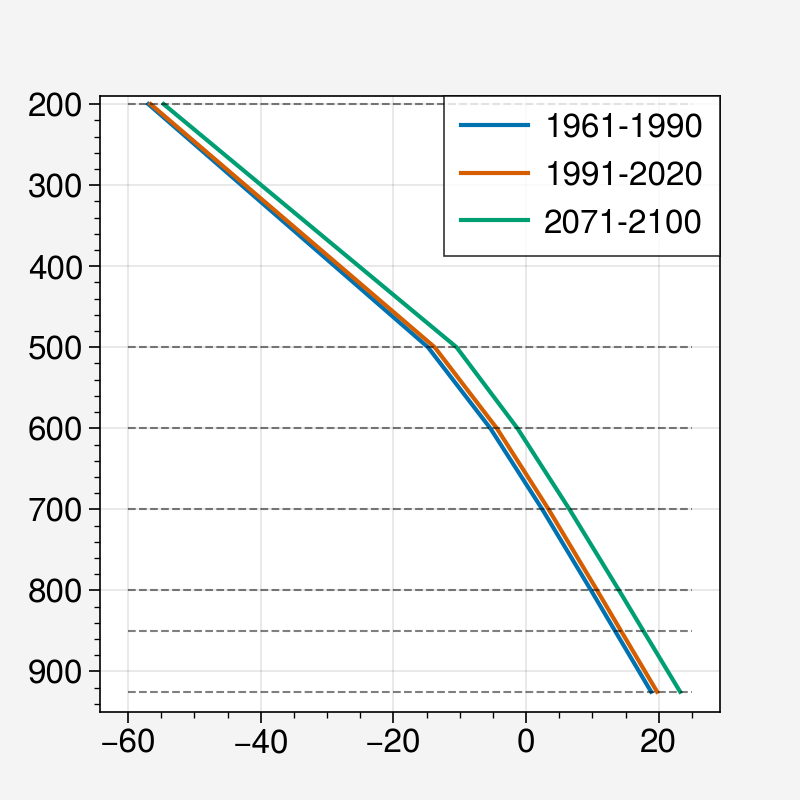

In [52]:
plt.plot(meanalps_mean1990_TTp,pressure,label='1961-1990')#,linestyle=':')
plt.plot(meanalps_mean2020_TTp,pressure,label='1991-2020')
plt.plot(meanalps_mean2100_TTp,pressure,label='2071-2100')

plt.plot([-60,25],[925,925],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
plt.plot([-60,25],[850,850],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
plt.plot([-60,25],[800,800],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
plt.plot([-60,25],[700,700],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
plt.plot([-60,25],[600,600],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
plt.plot([-60,25],[500,500],linestyle='--',c='k',linewidth=0.75,alpha=0.5)
plt.plot([-60,25],[200,200],linestyle='--',c='k',linewidth=0.75,alpha=0.5)

plt.ylim(950,190)
plt.legend()

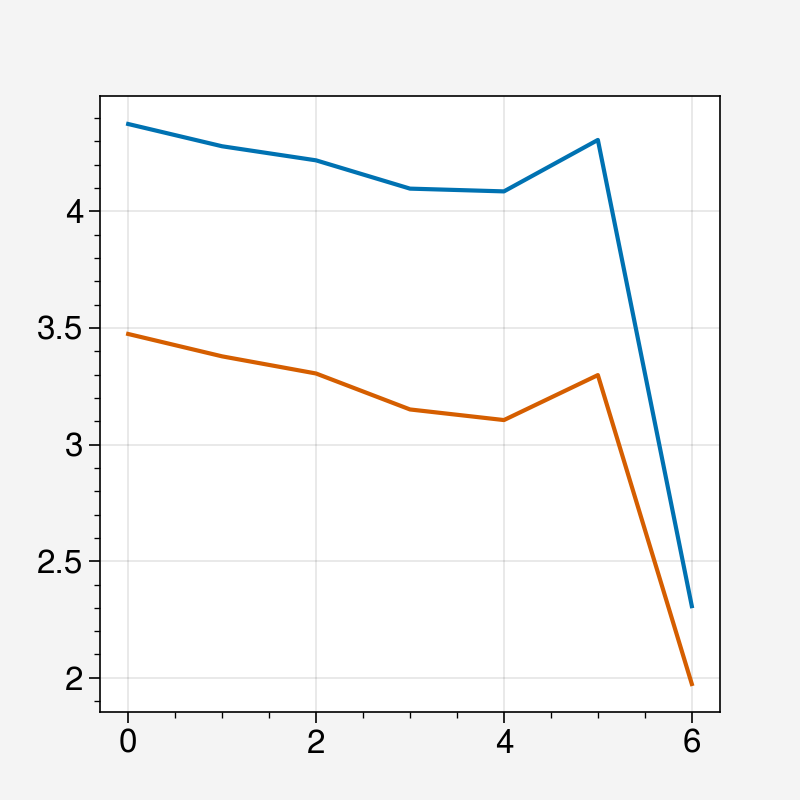

In [53]:
plt.plot(meanalps_mean2100_TTp-meanalps_mean1990_TTp)
plt.plot(meanalps_mean2100_TTp-meanalps_mean2020_TTp)

In [54]:
msk_TTp = np.stack((msk_925,msk_850,msk_800,msk_700,msk_600,msk_500,msk_200))
msk_TTp.shape

(7, 4, 91, 139)

/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to ins

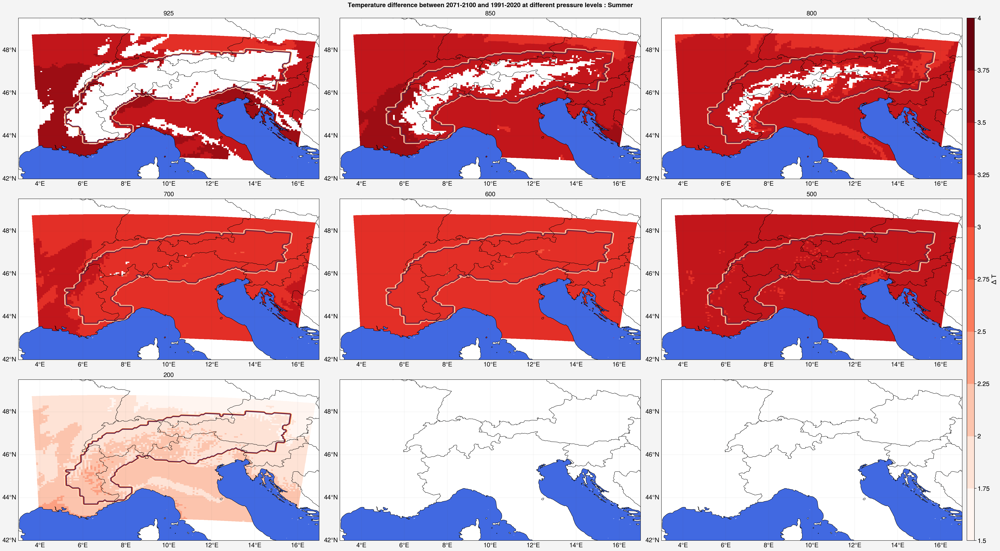

In [55]:
f, axs = pplt.subplots(proj='cyl', axwidth=8,ncols=3,nrows=3)

Pressures = ['925','850','800','700','600','500','200']
Altitudes = [750,1500,2000,3000,4200,5600,11800]

for i in range(7):
    ax=axs[i]
    diff = np.ma.masked_array(mean2100_JJA_meanseason_meanTTp[i],mask = np.invert(msk_TTp[i,seas])
                             ) - np.ma.masked_array(mean2020_JJA_meanseason_meanTTp[i],mask = np.invert(msk_TTp[i,seas]))
    m=ax.pcolormesh(lon, lat, diff, levels=12,cmap='Reds',vmin=1.5,vmax=4.)
    ax.contour(lon, lat,alps)
    ax.format(title=Pressures[i])
    
f.colorbar(m,label= '$\Delta$ T')

#ax.contour(lon, lat,north_french_alps)
normal_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True,
                 'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[42.,49.5],'lonlim':[3.,17.]}
axs.format(**normal_format,suptitle='Temperature difference between 2071-2100 and 1991-2020 at different pressure levels : Summer')
axs.format(ocean=True,oceancolor='royalblue',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to ins

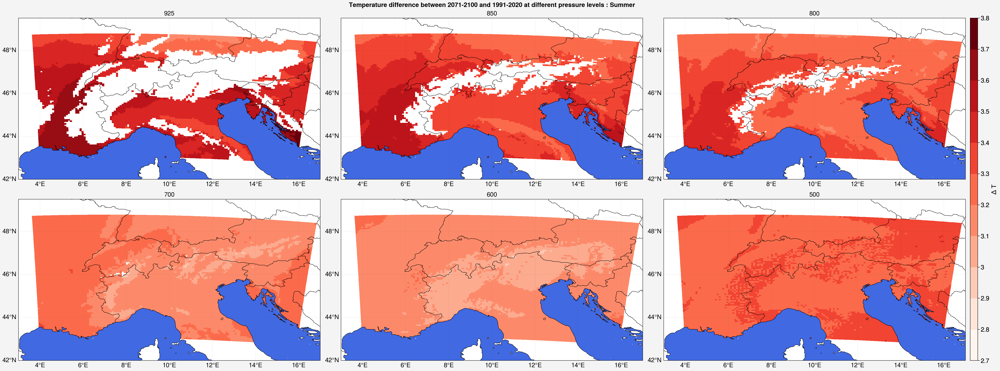

In [56]:
f, axs = pplt.subplots(proj='cyl', axwidth=8,ncols=3,nrows=2)

Pressures = ['925','850','800','700','600','500','200']
Altitudes = [750,1500,2000,3000,4200,5600,11800]

for i in range(6):
    ax=axs[i]
    diff = np.ma.masked_array(mean2100_JJA_meanseason_meanTTp[i],mask = np.invert(msk_TTp[i,seas])
                             ) - np.ma.masked_array(mean2020_JJA_meanseason_meanTTp[i],mask = np.invert(msk_TTp[i,seas]))
    m=ax.pcolormesh(lon, lat, diff, levels=13,cmap='Reds',vmin=2.7,vmax=3.9)
    ax.format(title=Pressures[i])
    
f.colorbar(m,label= '$\Delta$ T')

#ax.contour(lon, lat,north_french_alps)
normal_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True,
                 'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[42.,49.5],'lonlim':[3.,17.]}
axs.format(**normal_format,suptitle='Temperature difference between 2071-2100 and 1991-2020 at different pressure levels : Summer')
axs.format(ocean=True,oceancolor='royalblue',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

In [57]:
i=4
diff = np.ma.masked_array(mean2100_JJA_meanseason_meanTTp[i],mask = np.invert(msk_TTp[i,seas])
                             ) - np.ma.masked_array(mean2020_JJA_meanseason_meanTTp[i],mask = np.invert(msk_TTp[i,seas]))
diff.min()

2.940992453423508

/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to ins

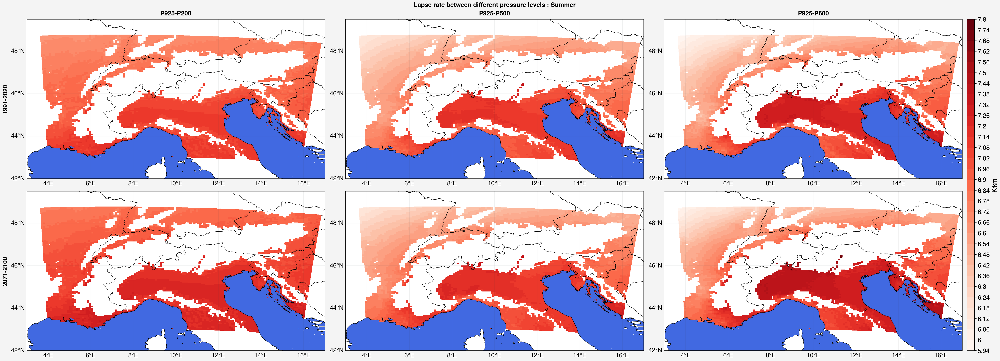

In [58]:
f, axs = pplt.subplots(proj='cyl', axwidth=8,ncols=3,nrows=2)

Pressures = ['925','850','800','700','600','500','200']
Altitudes = [750,1500,2000,3000,4200,5600,11800]

for i in range(3):
    ax=axs[0,i]
    diff = -(np.ma.masked_array(mean2020_JJA_meanseason_meanTTp[6-i],mask = np.invert(msk_925[seas])
                             )-np.ma.masked_array(mean2020_JJA_meanseason_meanTTp[0],mask = np.invert(msk_925[seas])) 
           )/(Altitudes[6-i]/1000 - Altitudes[0]/1000)
    m=ax.pcolormesh(lon, lat, diff, levels=34,cmap='Reds',vmin=5.9,vmax=7.8)
    
    ax=axs[1,i]
    diff = -(np.ma.masked_array(mean2100_JJA_meanseason_meanTTp[6-i],mask = np.invert(msk_925[seas])
                             )-np.ma.masked_array(mean2100_JJA_meanseason_meanTTp[0],mask = np.invert(msk_925[seas])) 
           )/(Altitudes[6-i]/1000 - Altitudes[0]/1000)
    m=ax.pcolormesh(lon, lat, diff, levels=34,cmap='Reds',vmin=5.9,vmax=7.8)
    #f.colorbar(m,label= 'K/km',loc='b',col=i+1)
    
f.colorbar(m,label= 'K/km')

#ax.contour(lon, lat,north_french_alps)
normal_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True,
                 'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[42.,49.5],'lonlim':[3.,17.]}
axs.format(**normal_format,suptitle='Lapse rate between different pressure levels : Summer',rowlabels=['1991-2020','2071-2100'],
          collabels=['P925-P200','P925-P500','P925-P600'])
axs.format(ocean=True,oceancolor='royalblue',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/miniforge3/envs/phd_v1/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


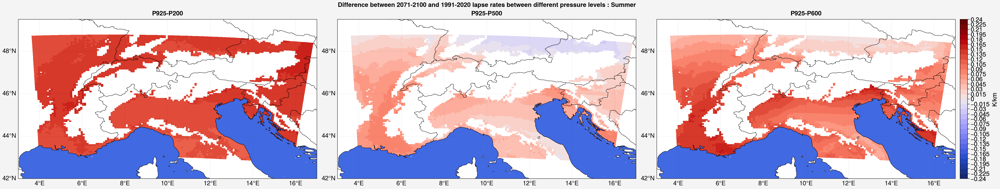

In [59]:
f, axs = pplt.subplots(proj='cyl', axwidth=8,ncols=3)

Pressures = ['925','850','800','700','600','500','200']
Altitudes = [750,1500,2000,3000,4200,5600,11800]

for i in range(3):
    ax=axs[i]
    diff2020 = -(np.ma.masked_array(mean2020_JJA_meanseason_meanTTp[6-i],mask = np.invert(msk_925[seas])
                             )-np.ma.masked_array(mean2020_JJA_meanseason_meanTTp[0],mask = np.invert(msk_925[seas])) 
           )/(Altitudes[6-i]/1000 - Altitudes[0]/1000)

    diff2100 = -(np.ma.masked_array(mean2100_JJA_meanseason_meanTTp[6-i],mask = np.invert(msk_925[seas])
                             )-np.ma.masked_array(mean2100_JJA_meanseason_meanTTp[0],mask = np.invert(msk_925[seas])) 
           )/(Altitudes[6-i]/1000 - Altitudes[0]/1000)
    m=ax.pcolormesh(lon, lat, diff2100 - diff2020, levels=34,cmap='BR',vmin=-0.25,vmax=0.25)
    #f.colorbar(m,label= 'K/km',loc='b',col=i+1)
    
f.colorbar(m,label= 'K/km')

#ax.contour(lon, lat,north_french_alps)
normal_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True,
                 'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[42.,49.5],'lonlim':[3.,17.]}
axs.format(**normal_format,suptitle='Difference between 2071-2100 and 1991-2020 lapse rates between different pressure levels : Summer',#rowlabels=['1991-2020','2071-2100'],
          collabels=['P925-P200','P925-P500','P925-P600'])
axs.format(ocean=True,oceancolor='royalblue',reso='hi')#, latlim=[40.,51.],lonlim=[0.,20.])

### By month

NameError: name 'monthly_levels_data' is not defined

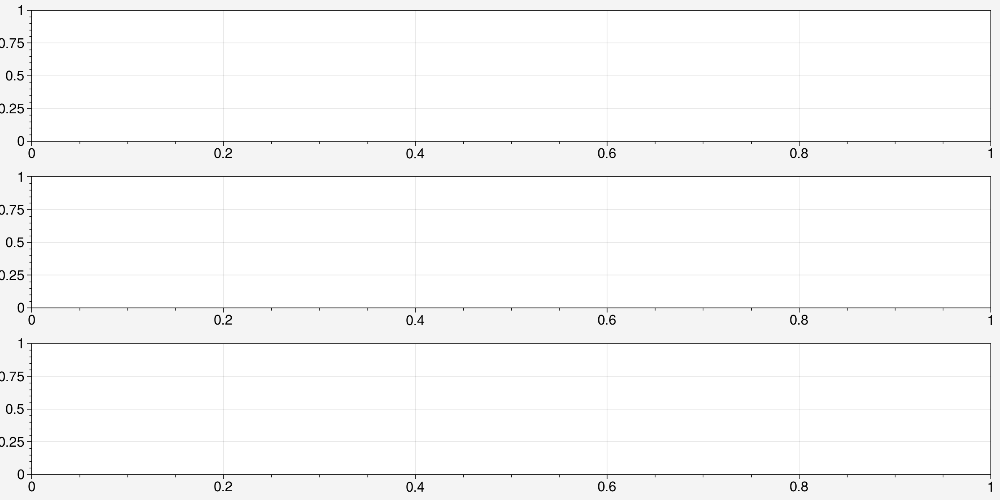

In [60]:
time = np.linspace(1961,2100,140)
y1,yn = 60,140
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig,axs = pplt.subplots(nrows=3,figsize=(12,6), share=False)# ,hratios=(1, 1,1,1) )
for col in range(2):
    for j,v in enumerate([[3,4,5],[0,1,2]][col]):
        for i in range(len(levels)):
            les_delta = np.zeros(12)#len(levels),
            for m,month in enumerate(months):
                if v==2:
                    a, _ = np.polyfit(time[y1:yn],monthly_levels_data[y1:yn,m,i,1]+monthly_levels_data[y1:yn,m,i,2], 1)
                else:
                    a, _ = np.polyfit(time[y1:yn],monthly_levels_data[y1:yn,m,i,v], 1)
                les_delta[m] = a*80
            axs[j,col].plot(months,les_delta,color=color_levels[i])
        axs[j,col].set_title(name_data[v],fontsize=15)
        if v==2:
            axs[j,col].set_title('Rain+Snowfall (mm/d)',fontsize=15)
        if col==0:
            axs[j,col].set_ylim([0,8])
        # else:
        #     axs[j,col].set_ylim([-1,1])

fig.suptitle('French alps climate variations from 2020 to 2100 MAR-MPI',fontsize=20)
fig.legend(handles=[ mpatches.Patch(color=color_levels[i],label=name_levels[i]) for i in range(6)],
          fontsize=15, ncols=6, center=True, frame=False, loc='b')

In [ ]:


for
T_month = xr.open_dataset('/bettik/beaumetj/MARout/MAR-MPI-ESM1-2-HR/HIST/monthly/MON.MPI-ESM_HIST.EUy.TTz.2000.nc').TTz[:,0,jmin:jmax,imin:imax]

T_month

In [ ]:
T_month_alps = np.ma.array(T_month,mask=np.invert(np.repeat(levels[i][np.newaxis,:,:],12,axis=0)))

meanT_month_alps = T_month_alps.mean(axis=(1,2))

In [ ]:
first_year = 2015
last_year = 2100
monthly_levels_data = np.zeros(((last_year-first_year+1),12,len(levels),3))

for year in list(range(first_year,last_year+1)):
    print(year,end=' ')

    path = '/bettik/beaumetj/MARout/MAR-EC-Earth3/SSP245/monthly/MON.EC-Earth3_SSP245.EUe.'
    
    T2 = xr.open_dataset(path+'TTz.'+str(year)+'.nc').TTz[:,0,jmin:jmax,imin:imax]
    T50 = xr.open_dataset(path+'TTz.'+str(year)+'.nc').TTmax[:,2,jmin:jmax,imin:imax]
    T100 = xr.open_dataset(path+'TTz.'+str(year)+'.nc').TTmin[:,3,jmin:jmax,imin:imax]     
    
    alps
    
    T2_alps = np.ma.masked_array(T2,mask=np.invert(np.repeat(levels[i][np.newaxis,:,:],12,axis=0)))
    T50_alps = np.ma.masked_array(T50,mask=np.invert(np.repeat(levels[i][np.newaxis,:,:],12,axis=0)))
    T100_alps = np.ma.masked_array(T100,mask=np.invert(np.repeat(levels[i][np.newaxis,:,:],12,axis=0)))
                               
    iyear = year-first_year
    for i,lev in enumerate(levels):
        flat_lev = lev.reshape(nlon*nlat)
        monthly_levels_data[iyear,:,i,0] = np.sum( SC_flat[:,flat_lev] ,axis=1) /surface_levels[i]
        monthly_levels_data[iyear,:,i,1] = np.sum( SF_flat[:,flat_lev] ,axis=1) /surface_levels[i]
        monthly_levels_data[iyear,:,i,2] = np.sum( R_flat[:,flat_lev] ,axis=1) /surface_levels[i]
        monthly_levels_data[iyear,:,i,3] = np.sum( T_flat[:,flat_lev] ,axis=1) /surface_levels[i]
        monthly_levels_data[iyear,:,i,4] = np.sum( Tmax_flat[:,flat_lev] ,axis=1) /surface_levels[i]
        monthly_levels_data[iyear,:,i,5] = np.sum( Tmin_flat[:,flat_lev] ,axis=1) /surface_levels[i]
        monthly_levels_data[iyear,:,i,6] = np.sum( MB_flat[:,flat_lev] ,axis=1) /surface_levels[i]
        

In [ ]:
i=0

flat_lev = levels[i].reshape(nlon*nlat)
np.sum( T_flat[:,flat_lev] ,axis=1) /surface_levels[i]

In [ ]:
TTT = np.ma.array(T.groupby("time.month").mean("time"),mask=np.invert(np.repeat(levels[i][np.newaxis,:,:],12,axis=0)))

TTT.mean(axis=(1,2))

In [ ]:
T_month = xr.open_dataset('/bettik/beaumetj/MARout/MAR-MPI-ESM1-2-HR/HIST/monthly/MON.MPI-ESM_HIST.EUy.TTz.2000.nc').TTz[:,0,jmin:jmax,imin:imax]

T_month

In [ ]:
T_month_alps = np.ma.array(T_month,mask=np.invert(np.repeat(levels[i][np.newaxis,:,:],12,axis=0)))

T_month_alps.mean(axis=(1,2))

### MPI

In [78]:
def get_slopes_and_origin(wp_meanseason):

    wp_meanseason_hist = wp_meanseason[:54,:,:,:]
    wp_meanseason_fut = wp_meanseason[55:,:,:,:]
    
    origin_hist=np.full(wp_meanseason_hist.shape[1:4],np.nan)
    slope_hist=np.full(wp_meanseason_hist.shape[1:4],np.nan)
    pvalue_hist=np.full(wp_meanseason_hist.shape[1:4],np.nan)
    
    origin_fut=np.full(wp_meanseason_fut.shape[1:4],np.nan)
    slope_fut=np.full(wp_meanseason_fut.shape[1:4],np.nan)
    pvalue_fut=np.full(wp_meanseason_fut.shape[1:4],np.nan)
    
    for i in range(wp_meanseason.shape[3]):
        # print(str(lon)+'/'+str(les_season_maxT.shape[3]),end=' ')
        for j in range(wp_meanseason.shape[2]):
            for season in range(4):
                linregress_hist = linregress(np.arange(wp_meanseason_hist.shape[0]), wp_meanseason_hist[:,season,j,i])
                origin_hist[season][j][i] = linregress_hist.intercept
                slope_hist[season][j][i] = linregress_hist.slope
                pvalue_hist[season][j][i] = linregress_hist.pvalue
                
                linregress_fut = linregress(np.arange(wp_meanseason_fut.shape[0]), wp_meanseason_fut[:,season,j,i])
                origin_fut[season][j][i] = linregress_fut.intercept
                slope_fut[season][j][i] = linregress_fut.slope
                pvalue_fut[season][j][i] = linregress_fut.pvalue

    return slope_hist, slope_fut, origin_hist, origin_fut

In [79]:
wp_meanseason_meanT_245 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_meanT.npy')[:,:,jmin:jmax,imin:imax]

wp_meanseason_meanT_585 = np.copy(wp_meanseason_meanT_245)
fp_meanseason_meanT_585 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_meanT.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanT_585[54:,:,:,:] = fp_meanseason_meanT_585

In [118]:
slope_T_hist,slope_T_245,origin_T_hist,origin_T_245 = get_slopes_and_origin(wp_meanseason_meanT_245)

slope_T_hist,slope_T_585,origin_T_hist,origin_T_585 = get_slopes_and_origin(wp_meanseason_meanT_585)

In [81]:
wp_meanseason_meanTTp_245 = np.full((7,140,4,91,139),np.nan)

wp_meanseason_meanTTp_245[0] = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_meanTTp_925.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp_245[1] = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_meanTTp_850.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp_245[2] = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_meanTTp_800.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp_245[3] = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_meanTTp_700.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp_245[4] = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_meanTTp_600.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp_245[5] = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_meanTTp_500.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp_245[6] = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_meanTTp_200.npy')[:,:,jmin:jmax,imin:imax]


wp_meanseason_meanTTp_585 = np.full((7,86,4,91,139),np.nan)

wp_meanseason_meanTTp_585[0] = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_meanTTp_925.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp_585[1] = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_meanTTp_850.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp_585[2] = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_meanTTp_800.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp_585[3] = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_meanTTp_700.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp_585[4] = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_meanTTp_600.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp_585[5] = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_meanTTp_500.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanTTp_585[6] = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_meanTTp_200.npy')[:,:,jmin:jmax,imin:imax]

In [82]:
origin_TTp_hist=np.full((7,4,91,139),np.nan)
slope_TTp_hist=np.full((7,4,91,139),np.nan)
pvalue_TTp_hist=np.full((7,4,91,139),np.nan)

origin_TTp_245=np.full((7,4,91,139),np.nan)
slope_TTp_245=np.full((7,4,91,139),np.nan)
pvalue_TTp_245=np.full((7,4,91,139),np.nan)

origin_TTp_585=np.full((7,4,91,139),np.nan)
slope_TTp_585=np.full((7,4,91,139),np.nan)
pvalue_TTp_585=np.full((7,4,91,139),np.nan)

# pressures = [925,850,800,700,600,500,200]

for i in range(139):
    # print(str(lon)+'/'+str(les_season_maxT.shape[3]),end=' ')
    print(i,end=' ')
    for j in range(91):
        for season in range(4):
            for P in range(7):
                linregress_T_hist = linregress(np.arange(54), wp_meanseason_meanTTp_245[P,:54,season,j,i]) #hist : 1961-2014, 54 years
                origin_TTp_hist[P][season][j][i] = linregress_T_hist.intercept
                slope_TTp_hist[P][season][j][i] = linregress_T_hist.slope
                pvalue_TTp_hist[P][season][j][i] = linregress_T_hist.pvalue
            
                linregress_T_245 = linregress(np.arange(85), wp_meanseason_meanTTp_245[P,55:,season,j,i]) #fut : 2015-2100, 85 years
                origin_TTp_245[P][season][j][i] = linregress_T_245.intercept
                slope_TTp_245[P][season][j][i] = linregress_T_245.slope
                pvalue_TTp_245[P][season][j][i] = linregress_T_245.pvalue

                linregress_T_585 = linregress(np.arange(86), wp_meanseason_meanTTp_585[P,:,season,j,i]) #fut : 2015-2100, 85 years
                origin_TTp_585[P][season][j][i] = linregress_T_585.intercept
                slope_TTp_585[P][season][j][i] = linregress_T_585.slope
                pvalue_TTp_585[P][season][j][i] = linregress_T_585.pvalue

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 

In [83]:
wp_meanseason_meanSP_245 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP245/wp_meanseason_meanSP.npy')[:,:,jmin:jmax,imin:imax]

wp_meanseason_meanSP_585 = np.copy(wp_meanseason_meanSP_245)
fp_meanseason_meanSP_585 = np.load('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/fp_meanseason_meanSP.npy')[:,:,jmin:jmax,imin:imax]
wp_meanseason_meanSP_585[54:,:,:,:] = fp_meanseason_meanSP_585

wp_meanseason_meanSP_245.shape

(140, 4, 91, 139)

In [84]:
meanSP_245 = wp_meanseason_meanSP_245.mean(axis=(0,1))
meanSP_585 = wp_meanseason_meanSP_585.mean(axis=(0,1))

meanSP_245.shape

(91, 139)

In [119]:
alps_SP_245_925 = np.copy(alps)
alps_SP_245_850 = np.copy(alps)
alps_SP_245_800 = np.copy(alps)
alps_SP_245_700 = np.copy(alps)
alps_SP_245_600 = np.copy(alps)
alps_SP_245_500 = np.copy(alps)
alps_SP_245_200 = np.copy(alps)

alps_SP_245_925[meanSP_245>945] = False
alps_SP_245_925[meanSP_245<905] = False

alps_SP_245_850[meanSP_245>870] = False
alps_SP_245_850[meanSP_245<830] = False

alps_SP_245_800[meanSP_245>820] = False
alps_SP_245_800[meanSP_245<780] = False

alps_SP_245_700[meanSP_245>720] = False
alps_SP_245_700[meanSP_245<680] = False

alps_SP_245_600[meanSP_245>620] = False
alps_SP_245_600[meanSP_245<580] = False

alps_SP_245_500[meanSP_245>520] = False
alps_SP_245_500[meanSP_245<480] = False

alps_SP_245 = [alps_SP_245_925,alps_SP_245_850,alps_SP_245_800,alps_SP_245_700,alps_SP_245_600,alps_SP_245_500,alps_SP_245_200]

In [120]:
alps_SP_585_925 = np.copy(alps)
alps_SP_585_850 = np.copy(alps)
alps_SP_585_800 = np.copy(alps)
alps_SP_585_700 = np.copy(alps)
alps_SP_585_600 = np.copy(alps)
alps_SP_585_500 = np.copy(alps)
alps_SP_585_200 = np.copy(alps)

alps_SP_585_925[meanSP_585>945] = False
alps_SP_585_925[meanSP_585<905] = False

alps_SP_585_850[meanSP_585>870] = False
alps_SP_585_850[meanSP_585<830] = False

alps_SP_585_800[meanSP_585>820] = False
alps_SP_585_800[meanSP_585<780] = False

alps_SP_585_700[meanSP_585>720] = False
alps_SP_585_700[meanSP_585<680] = False

alps_SP_585_600[meanSP_585>620] = False
alps_SP_585_600[meanSP_585<580] = False

alps_SP_585_500[meanSP_585>520] = False
alps_SP_585_500[meanSP_585<480] = False

alps_SP_585 = [alps_SP_585_925,alps_SP_585_850,alps_SP_585_800,alps_SP_585_700,alps_SP_585_600,alps_SP_585_500,alps_SP_585_200]

In [121]:
# mask for under-the-surface values at 800hPa and other pressures

msk_245_925 = (wp_meanseason_meanTTp_245[0].mean(axis=0) < 1000) # 1000 :  arbitrary value, we just want to filter out the 10**(34) values
msk_245_850 = (wp_meanseason_meanTTp_245[1].mean(axis=0) < 1000)
msk_245_800 = (wp_meanseason_meanTTp_245[2].mean(axis=0) < 1000)
msk_245_700 = (wp_meanseason_meanTTp_245[3].mean(axis=0) < 1000)
msk_245_600 = (wp_meanseason_meanTTp_245[4].mean(axis=0) < 1000)
msk_245_500 = (wp_meanseason_meanTTp_245[5].mean(axis=0) < 1000)
msk_245_200 = (wp_meanseason_meanTTp_245[6].mean(axis=0) < 1000)



alps_TTp_245_925 = np.logical_and(alps,msk_245_925)
alps_TTp_245_850 = np.logical_and(alps,msk_245_850)
alps_TTp_245_800 = np.logical_and(alps,msk_245_800)
alps_TTp_245_700 = np.logical_and(alps,msk_245_700)
alps_TTp_245_600 = np.logical_and(alps,msk_245_600)
alps_TTp_245_500 = np.logical_and(alps,msk_245_500)
alps_TTp_245_200 = np.logical_and(alps,msk_245_200)

alps_TTp_245 = [alps_TTp_245_925,alps_TTp_245_850,alps_TTp_245_800,alps_TTp_245_700,alps_TTp_245_600,alps_TTp_245_500,alps_TTp_245_200]

In [122]:
# mask for under-the-surface values at 800hPa and other pressures

msk_585_925 = (wp_meanseason_meanTTp_585[0].mean(axis=0) < 1000) # 1000 :  arbitrary value, we just want to filter out the 10**(34) values
msk_585_850 = (wp_meanseason_meanTTp_585[1].mean(axis=0) < 1000)
msk_585_800 = (wp_meanseason_meanTTp_585[2].mean(axis=0) < 1000)
msk_585_700 = (wp_meanseason_meanTTp_585[3].mean(axis=0) < 1000)
msk_585_600 = (wp_meanseason_meanTTp_585[4].mean(axis=0) < 1000)
msk_585_500 = (wp_meanseason_meanTTp_585[5].mean(axis=0) < 1000)
msk_585_200 = (wp_meanseason_meanTTp_585[6].mean(axis=0) < 1000)


alps_TTp_585_925 = np.logical_and(alps,msk_585_925)
alps_TTp_585_850 = np.logical_and(alps,msk_585_850)
alps_TTp_585_800 = np.logical_and(alps,msk_585_800)
alps_TTp_585_700 = np.logical_and(alps,msk_585_700)
alps_TTp_585_600 = np.logical_and(alps,msk_585_600)
alps_TTp_585_500 = np.logical_and(alps,msk_585_500)
alps_TTp_585_200 = np.logical_and(alps,msk_585_200)

alps_TTp_585 = [alps_TTp_585_925,alps_TTp_585_850,alps_TTp_585_800,alps_TTp_585_700,alps_TTp_585_600,alps_TTp_585_500,alps_TTp_585_200]

In [89]:
pressure4 = [925,850,800,700]
pressure = [925,850,800,700,600,500,200]

/tmp/ipykernel_262742/3909575313.py:1: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=12)
/tmp/ipykernel_262742/3909575313.py:1: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=12)


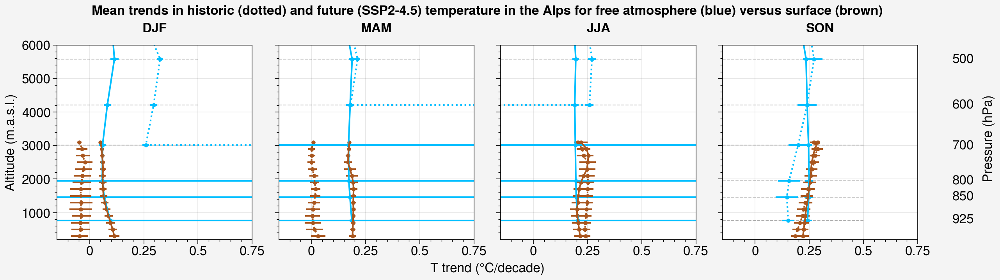

In [123]:
pplt.rc.update(small=12, large=12)
# Both, for SSP245
f, axs = pplt.subplots(ncols=4)

n_levels=len(levels)
n_seas=4
n_plevels=len(pressure)

mean_slope_surf_hist=np.full((n_seas,n_levels),np.nan)
mean_slope_TTp_hist=np.full((n_seas,n_plevels),np.nan)
std_slope_surf_hist=np.full((n_seas,n_levels),np.nan)
std_slope_TTp_hist=np.full((n_seas,n_plevels),np.nan)

mean_slope_surf_fut=np.full((n_seas,n_levels),np.nan)
mean_slope_TTp_fut=np.full((n_seas,n_plevels),np.nan)
std_slope_surf_fut=np.full((n_seas,n_levels),np.nan)
std_slope_TTp_fut=np.full((n_seas,n_plevels),np.nan)


for i in range(4): # seasons
    ax = axs[i]
    for m in range(n_plevels):
        ax.plot([-0.15,0.5],[H_levels_pressure[m],H_levels_pressure[m]],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    
    for j in range(n_levels): # P levels

        slope_surf_hist = np.ma.masked_array(slope_T_hist[i], mask=np.invert(levels[j])).reshape(12649)
        mean_slope_surf_hist[i,j] = 10*slope_surf_hist.mean()
        std_slope_surf_hist[i,j] = 10*slope_surf_hist.std()
        ax.plot([10*slope_surf_hist.mean()-10*slope_surf_hist.std(),10*slope_surf_hist.mean()+10*slope_surf_hist.std()],
                [H_levels[j],H_levels[j]],c='sienna')
        
        slope_surf_fut = np.ma.masked_array(slope_T_245[i], mask=np.invert(levels[j])).reshape(12649)
        mean_slope_surf_fut[i,j] = 10*slope_surf_fut.mean()
        std_slope_surf_fut[i,j] = 10*slope_surf_fut.std()
        ax.plot([10*slope_surf_fut.mean()-10*slope_surf_fut.std(),10*slope_surf_fut.mean()+10*slope_surf_fut.std()],
                [H_levels[j],H_levels[j]],c='sienna')
        
        if j<n_plevels:
            slope_TTp_hist_msk = np.ma.masked_array(slope_TTp_hist[j,i], mask=np.invert(alps_TTp_245[j][i])).reshape(12649)
            mean_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.mean()
            std_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.std()
            ax.plot([10*slope_TTp_hist_msk.mean()-10*slope_TTp_hist_msk.std(),10*slope_TTp_hist_msk.mean()+10*slope_TTp_hist_msk.std()],
                [H_levels_pressure[j],H_levels_pressure[j]],c='deepskyblue')
            
            slope_TTp_fut_msk = np.ma.masked_array(slope_TTp_245[j,i], mask=np.invert(alps_TTp_245[j][i])).reshape(12649)
            mean_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.mean()
            std_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.std()
            ax.plot([10*slope_TTp_fut_msk.mean()-10*slope_TTp_fut_msk.std(),10*slope_TTp_fut_msk.mean()+10*slope_TTp_fut_msk.std()],
                [H_levels_pressure[j],H_levels_pressure[j]],c='deepskyblue')
            
            
    ax.plot(mean_slope_TTp_hist[i,:],H_levels_pressure,label='Free atmosphere',linestyle=':',c='deepskyblue')
    ax.plot(mean_slope_surf_hist[i,:],H_levels,label='Surface',linestyle=':',c='sienna')
    ax.scatter(mean_slope_TTp_hist[i,:],H_levels_pressure,label='Free atmosphere',s=10,c='deepskyblue')
    ax.scatter(mean_slope_surf_hist[i,:],H_levels,label='Surface',s=10,c='sienna')
    
    ax.plot(mean_slope_TTp_fut[i,:],H_levels_pressure,label='Free atmosphere',c='deepskyblue')
    ax.plot(mean_slope_surf_fut[i,:],H_levels,label='Surface',c='sienna')
    ax.scatter(mean_slope_TTp_fut[i,:],H_levels_pressure,label='Free atmosphere',s=10,c='deepskyblue')
    ax.scatter(mean_slope_surf_fut[i,:],H_levels,label='Surface',s=10,c='sienna')
    
    
    if i==3:
        ax.text(0.91, 680, "925", fontsize=12)
        ax.text(0.91, 1370, "850", fontsize=12)
        ax.text(0.91, 1850, "800", fontsize=12)
        ax.text(0.91, 2890, "700", fontsize=12)
        ax.text(0.91, 4110, "600", fontsize=12)
        ax.text(0.91, 5460, "500", fontsize=12)
        #ax.text(0.61, 11650, "200", fontsize=9)
        ax.text(1.05,2000,'Pressure (hPa)',rotation='vertical',fontsize=12)
    
    ax.set_xlim(-0.15,0.5)
    ax.set_xticks(np.arange(0.,1.,0.25))
    ax.set_ylim(200,6000)


axs.format(suptitle='Mean trends in historic (dotted) and future (SSP2-4.5) temperature in the Alps for free atmosphere (blue) versus surface (brown)',
           collabels=['DJF','MAM','JJA', 'SON'],xlabel='T trend (°C/decade)',ylabel='Altitude (m.a.s.l.)')

/tmp/ipykernel_262742/282791448.py:1: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=12, large=12)
/tmp/ipykernel_262742/282791448.py:1: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=12, large=12)


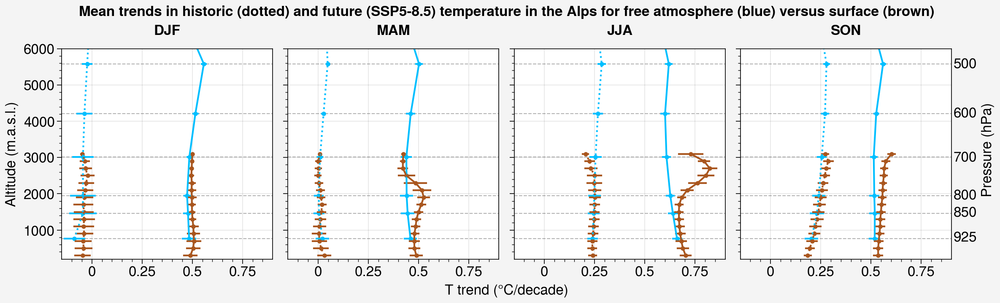

In [91]:
pplt.rc.update(small=12, large=12)
# Both, for SSP585
f, axs = pplt.subplots(ncols=4)

n_levels=len(levels)
n_seas=4
n_plevels=len(pressure)

mean_slope_surf_hist=np.full((n_seas,n_levels),np.nan)
mean_slope_TTp_hist=np.full((n_seas,n_plevels),np.nan)
std_slope_surf_hist=np.full((n_seas,n_levels),np.nan)
std_slope_TTp_hist=np.full((n_seas,n_plevels),np.nan)

mean_slope_surf_fut=np.full((n_seas,n_levels),np.nan)
mean_slope_TTp_fut=np.full((n_seas,n_plevels),np.nan)
std_slope_surf_fut=np.full((n_seas,n_levels),np.nan)
std_slope_TTp_fut=np.full((n_seas,n_plevels),np.nan)


for i in range(4): # seasons
    ax = axs[i]
    for m in range(n_plevels):
        ax.plot([-0.15,0.9],[H_levels_pressure[m],H_levels_pressure[m]],linestyle='--',c='k',linewidth=0.75,alpha=0.3)
    
    for j in range(n_levels): # P levels

        slope_surf_hist = np.ma.masked_array(slope_T_hist[i], mask=np.invert(levels[j])).reshape(12649)
        mean_slope_surf_hist[i,j] = 10*slope_surf_hist.mean()
        std_slope_surf_hist[i,j] = 10*slope_surf_hist.std()
        ax.plot([10*slope_surf_hist.mean()-10*slope_surf_hist.std(),10*slope_surf_hist.mean()+10*slope_surf_hist.std()],
                [H_levels[j],H_levels[j]],c='sienna')
        
        slope_surf_fut = np.ma.masked_array(slope_T_585[i], mask=np.invert(levels[j])).reshape(12649)
        mean_slope_surf_fut[i,j] = 10*slope_surf_fut.mean()
        std_slope_surf_fut[i,j] = 10*slope_surf_fut.std()
        ax.plot([10*slope_surf_fut.mean()-10*slope_surf_fut.std(),10*slope_surf_fut.mean()+10*slope_surf_fut.std()],
                [H_levels[j],H_levels[j]],c='sienna')
        
        if j<n_plevels:
            slope_TTp_hist_msk = np.ma.masked_array(slope_TTp_hist[j,i], mask=np.invert(alps_TTp_245[j][i])).reshape(12649) # leave alps_TTp_245, there's a bug with
                                                                                                                            # alps_TTp_585 (investigate problem ?)
            mean_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.mean()
            std_slope_TTp_hist[i,j] = 10*slope_TTp_hist_msk.std()
            ax.plot([10*slope_TTp_hist_msk.mean()-10*slope_TTp_hist_msk.std(),10*slope_TTp_hist_msk.mean()+10*slope_TTp_hist_msk.std()],
                [H_levels_pressure[j],H_levels_pressure[j]],c='deepskyblue')
            
            slope_TTp_fut_msk = np.ma.masked_array(slope_TTp_585[j,i], mask=np.invert(alps_TTp_585[j][i])).reshape(12649)
            mean_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.mean()
            std_slope_TTp_fut[i,j] = 10*slope_TTp_fut_msk.std()
            ax.plot([10*slope_TTp_fut_msk.mean()-10*slope_TTp_fut_msk.std(),10*slope_TTp_fut_msk.mean()+10*slope_TTp_fut_msk.std()],
                [H_levels_pressure[j],H_levels_pressure[j]],c='deepskyblue')
            
            
    ax.plot(mean_slope_TTp_hist[i,:],H_levels_pressure,label='Free atmosphere',linestyle=':',c='deepskyblue')
    ax.plot(mean_slope_surf_hist[i,:],H_levels,label='Surface',linestyle=':',c='sienna')
    ax.scatter(mean_slope_TTp_hist[i,:],H_levels_pressure,label='Free atmosphere',s=10,c='deepskyblue')
    ax.scatter(mean_slope_surf_hist[i,:],H_levels,label='Surface',s=10,c='sienna')
    
    ax.plot(mean_slope_TTp_fut[i,:],H_levels_pressure,label='Free atmosphere',c='deepskyblue')
    ax.plot(mean_slope_surf_fut[i,:],H_levels,label='Surface',c='sienna')
    ax.scatter(mean_slope_TTp_fut[i,:],H_levels_pressure,label='Free atmosphere',s=10,c='deepskyblue')
    ax.scatter(mean_slope_surf_fut[i,:],H_levels,label='Surface',s=10,c='sienna')
    
    
    if i==3:
        ax.text(0.91, 680, "925", fontsize=12)
        ax.text(0.91, 1370, "850", fontsize=12)
        ax.text(0.91, 1850, "800", fontsize=12)
        ax.text(0.91, 2890, "700", fontsize=12)
        ax.text(0.91, 4110, "600", fontsize=12)
        ax.text(0.91, 5460, "500", fontsize=12)
        #ax.text(0.61, 11650, "200", fontsize=9)
        ax.text(1.05,2000,'Pressure (hPa)',rotation='vertical',fontsize=12)
    
    ax.set_xlim(-0.15,0.9)
    ax.set_xticks(np.arange(0.,1.,0.25))
    ax.set_ylim(200,6000)


axs.format(suptitle='Mean trends in historic (dotted) and future (SSP5-8.5) temperature in the Alps for free atmosphere (blue) versus surface (brown)',
           collabels=['DJF','MAM','JJA', 'SON'],xlabel='T trend (°C/decade)',ylabel='Altitude (m.a.s.l.)')

In [65]:
np.arange(-0.1,0.9,0.05)

array([-0.1 , -0.05,  0.  ,  0.05,  0.1 ,  0.15,  0.2 ,  0.25,  0.3 ,
        0.35,  0.4 ,  0.45,  0.5 ,  0.55,  0.6 ,  0.65,  0.7 ,  0.75,
        0.8 ,  0.85])